
<div style="text-align: center;">
  <h1 style="font-size: 30px; color: #DC143C; font-weight: bold;"> Predicting Shipping Delays and Enhancing Revenue<br>
with Data-Driven Insights</h1>
  <div style="margin-top: 40px;"></div>
</div>
<div style="text-align: right;">
  <p style="font-size: 20px; font-weight: bold;">
    Davide Abbattista
  </p>
</div>

### Table of contents
1. **Introduction**
2. **Data Loading**
3. **Data Exploration, Data Cleaning and Feature Selection**
4. **Model Development and Evaluation**
5. **Conclusions**

---

# 1 - Introduction
The objective of this project is to forecast shipping delays and quantify the expected delay in days. By accurately predicting delays, the shipping company can enhance service quality for its most profitable customers by tailoring predictions and evaluations based on revenue-generating clusters. This approach aims to improve customer satisfaction and operational efficiency by minimizing delays for high-revenue segments.


## 1.1 - Objectives
This notebook covers the following:
1. **Exploratory data analysis to understand the factors influencing shipping delays.**
2. **Identification of clusters that generate the highest revenues for the company.**
3. **Development of predictive models to forecast shipping delays and quantify expected delays in days.**
3. **Customization of the training and evaluation process by prioritizing the most profitable customer segments.**

## 1.2 - Dataset
The dataset used is made of 50 columns giving a comprehensive evaluation of the orders, customers and items purchased. 

There are numerical and categorical variables, two even time-related. Some columns are anonymized, others are uninformative, and other have high cardinality.

For our purposes, the target variable is the delta between “Days for shipping (real)” and “Days for shipment (scheduled)” columns.

## 1.2 - Requirements
The following package is required:

In [0]:
%pip install xgboost

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


The following libraries, methods and classes are required:

In [0]:
from pyspark.sql.functions import col, when, to_date, year, month, day, dayofweek, corr, sum, avg, count, stddev, rand, concat, lit, round
from pyspark.sql.types import StringType

from xgboost.spark import SparkXGBRegressor

from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler, StandardScaler, OneHotEncoder, StringIndexer
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.regression import LinearRegression
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

This project has been executed using **Databricks Runtime Version 13.3 LTS DBR ML** cluster.

---

# 2 - Data Loading

To ensure that the CSV is read correctly it is specified the timestamp format, such that any timestamp data is interpreted according to *M/d/yyyy H:mm*, and whitespaces are handled by ignoring them when are leading and trailing around the values in the rows.

In [0]:
file_location = "/FileStore/tables/SupplyChainDataset_V2.csv"
file_type = "csv"

infer_schema = "true"
first_row_is_header = "true"
delimiter = ","
timestamp_format = "M/d/yyyy H:mm"

df_v0 = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .option("timestampFormat", timestamp_format) \
  .option("ignoreLeadingWhiteSpace", "true") \
  .option("ignoreTrailingWhiteSpace", "true") \
  .load(file_location)

print(f"Rows number of the raw dataset: {df_v0.count()}")
print(f"Columns number of the raw dataset: {len(df_v0.columns)}")

Rows number of the raw dataset: 180519
Columns number of the raw dataset: 54


In [0]:
display(df_v0.limit(100))

_c0,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.25,314.6400146,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.2514534,-66.03705597,Pacific Asia,Bekasi,Indonesia,20755,2018-01-31T22:56:00Z,77202,1360,13.10999966,0.039999999,180517,327.75,0.289999992,1,327.75,314.6400146,91.25,Southeast Asia,Java Occidental,COMPLETE,null,1360,73,null,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-02-03T22:56:00Z,Standard Class
1,TRANSFER,5,4,-249.0899963,311.3599854,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.27945137,-66.0370636,Pacific Asia,Bikaner,India,19492,2018-01-13T12:27:00Z,75939,1360,16.38999939,0.050000001,179254,327.75,-0.800000012,1,327.75,311.3599854,-249.0899963,South Asia,Rajast�n,PENDING,null,1360,73,null,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-18T12:27:00Z,Standard Class
2,CASH,4,4,-247.7799988,309.7200012,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.29223251,-121.881279,Pacific Asia,Bikaner,India,19491,2018-01-13T12:06:00Z,75938,1360,18.03000069,0.059999999,179253,327.75,-0.800000012,1,327.75,309.7200012,-247.7799988,South Asia,Rajast�n,CLOSED,null,1360,73,null,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-17T12:06:00Z,Standard Class
3,DEBIT,3,4,22.86000061,304.8099976,Advance shipping,0,73,Sporting Goods,Los Angeles,EE. UU.,XXXXXXXXX,Tana,19490,Tate,XXXXXXXXX,Home Office,CA,3200 Amber Bend,90027.0,2,Fitness,34.12594605,-118.2910156,Pacific Asia,Townsville,Australia,19490,2018-01-13T11:45:00Z,75937,1360,22.94000053,0.07,179252,327.75,0.079999998,1,327.75,304.8099976,22.86000061,Oceania,Queensland,COMPLETE,null,1360,73,null,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-16T11:45:00Z,Standard Class
4,PAYMENT,2,4,134.2100067,298.25,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Orli,19489,Hendricks,XXXXXXXXX,Corporate,PR,8671 Iron Anchor Corners,725.0,2,Fitness,18.25376892,-66.03704834,Pacific Asia,Townsville,Australia,19489,2018-01-13T11:24:00Z,75936,1360,29.5,0.090000004,179251,327.75,0.449999988,1,327.75,298.25,134.2100067,Oceania,Queensland,PENDING_PAYMENT,null,1360,73,null,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-15T11:24:00Z,Standard Class
5,TRANSFER,6,4,18.57999992,294.980011,Shipping canceled,0,73,Sporting Goods,Tonawanda,EE. UU.,XXXXXXXXX,Kimberly,19488,Flowers,XXXXXXXXX,Consumer,NY,2122 Hazy Corner,14150.0,2,Fitness,43.01396942,-78.87906647,Pacific Asia,Toowoomba,Australia,19488,2018-01-13T11:03:00Z,75935,1360,32.77999878,0.100000001,179250,327.75,0.059999999,1,327.75,294.980011,18.57999992,Oceania,Queensland,CANCELED,null,1360,73,null,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-01-19T11:03:00Z,Standard Class
6,DEBIT,2,1,95.18000031,288.4200134,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Constance,19

The dataset contains 180,519 records and 54 features, reflecting a substantial amount of data with a wide range of attributes.

## 2.1 - Encoding Problems
There are encoding problems in *Order City*, *Order Country* and *Order State* columns, where certain characters appear as '�'.

However, this is strictly a visual issue and does not impact the accuracy of the predictive models.

---

# 3 - Data Exploration, Data Cleaning and Feature Selection 
This section outlines a comprehensive approach that integrates data exploration, data cleaning, and feature selection to enhance the quality and relevance of the dataset for predictive modeling and high-revenue cluster identification.

Data exploration involves analyzing the dataset to understand its underlying structure and highlight potential issues. Additionally, this exploration aids in identifying high-revenue clusters, allowing the prediction and evaluation processes to be tailored to segments that contribute significantly to overall revenue.

Following exploration, data cleaning is performed to address identified issues by removing irrelevant or redundant entries. This step ensures the dataset is accurate and reliable, which is essential for generating meaningful insights and supporting informed decision-making.

Feature selection occurs concurrently with exploration and cleaning, focusing on identifying and retaining the most informative features that contribute significantly to predictive models and high-revenue cluster analysis. By assessing the importance and impact of various features during the exploration phase, those that do not enhance predictive power or introduce redundancy are eliminated.

Together, these operations ensure the dataset is not only clean and accurate but also optimized for effective modeling and the identification of high-revenue clusters, leading to more robust and actionable insights.

## 3.1 - Data Types Consistency Check

After a visual analysis of the dataset, it is necessary to show the data types for each feature to see if they are consistent with what each feature is supposed to represent:

In [0]:
df_v0.printSchema()

root
 |-- _c0: integer (nullable = true)
 |-- Type: string (nullable = true)
 |-- Days for shipping (real): integer (nullable = true)
 |-- Days for shipment (scheduled): integer (nullable = true)
 |-- Benefit per order: double (nullable = true)
 |-- Sales per customer: double (nullable = true)
 |-- Delivery Status: string (nullable = true)
 |-- Late_delivery_risk: integer (nullable = true)
 |-- Category Id: integer (nullable = true)
 |-- Category Name: string (nullable = true)
 |-- Customer City: string (nullable = true)
 |-- Customer Country: string (nullable = true)
 |-- Customer Email: string (nullable = true)
 |-- Customer Fname: string (nullable = true)
 |-- Customer Id: integer (nullable = true)
 |-- Customer Lname: string (nullable = true)
 |-- Customer Password: string (nullable = true)
 |-- Customer Segment: string (nullable = true)
 |-- Customer State: string (nullable = true)
 |-- Customer Street: string (nullable = true)
 |-- Customer Zipcode: double (nullable = true)
 |-- 

*Order Zipcode* and *Customer Zipcode* have double type, but they should be a string. 

Therefore, the following operations are performed:

In [0]:
df_v0 = df_v0 \
  .withColumn('Order Zipcode', col('Order Zipcode').cast("int").cast("string")) \
  .withColumn('Customer Zipcode', col('Customer Zipcode').cast("int").cast("string"))

## 3.2 - Missing Values 

The number of missing values in each column is counted and displayed. The key goal is to identify which columns contain missing values and how many are missing, along with the percentage of missing data relative to the total number of rows in the dataset:

In [0]:
for c in df_v0.columns:
    cnt = df_v0.filter(col(c).isNull()).count()
    if cnt != 0:
        perc = cnt / df_v0.count()
        print(c+":", str(cnt)+" missing values", "("+str(perc*100)+"%)")

Customer Lname: 8 missing values (0.0044316664727812585%)
Customer Zipcode: 3 missing values (0.001661874927292972%)
Order Zipcode: 155679 missing values (86.23967560201419%)
Product Description: 180519 missing values (100.0%)


There are missing values (*Customer Lname*, *Customer Zipcode*, *Order Zipcode*, *Product Description* columns).

1. *Product Description* (100% Missing):
Since this column has 100% missing values, it provides no information and can be safely removed without any impact on the analysis.
2. *Customer Lname* (0.004% Missing):
This column has very few missing values. The analysis doesn’t require specific customer identification or last names, removing this column simplifies the data without loss of useful information.
3. *Customer Zipcode* (0.001% Missing) and *Order Zipcode* (86.24% Missing):
These columns can be removed because of redundancy and granularity. The dataset already contains other geographic information, the zip code might not add much value and could be seen as excessive detail. 

Therefore, these columns are removed:

In [0]:
df_v0 = df_v0 \
    .drop(col('Customer Lname')) \
    .drop(col('Customer Zipcode')) \
    .drop(col('Order Zipcode')) \
    .drop(col('Product Description')) 

##3.2 - Target Feature
A column containing the days of delay for each order is added. This is the target of the predictive models.

In [0]:
df_v0 = df_v0.withColumn('Shipping Days of Delay', col('Days for shipping (real)') - col('Days for shipment (scheduled)'))

### 3.2.1 - Analysis and Operations
Here there is the relation between *Shipping Days of Delay* and *Delivery Status*:

In [0]:
display(df_v0 \
    .groupBy(col('Shipping Days of Delay'), col('Delivery Status')) \
    .agg(count(col('Delivery Status')).alias('Count')))

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Delivery Status,Count
-1,Shipping canceled,981
0,Shipping canceled,1557
3,Late delivery,6772
3,Shipping canceled,280
0,Shipping on time,32196
4,Late delivery,6697
4,Shipping canceled,286
2,Shipping canceled,1167
1,Late delivery,57957
2,Late delivery,27551


Here the equivalent visualization obtained using SQL:

In [0]:
df_v0.createOrReplaceTempView("DataFrame")

In [0]:
%sql
SELECT 
    `Shipping Days of Delay`, 
    `Delivery Status`, 
    COUNT(`Delivery Status`) AS Count
FROM 
    DataFrame
GROUP BY 
    `Shipping Days of Delay`, 
    `Delivery Status`

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Delivery Status,Count
-1,Shipping canceled,981
0,Shipping canceled,1557
3,Late delivery,6772
3,Shipping canceled,280
0,Shipping on time,32196
4,Late delivery,6697
4,Shipping canceled,286
2,Shipping canceled,1167
1,Late delivery,57957
2,Late delivery,27551


*Shipping Days of Delay* has values between -2 (2 days in advance) and 4 (4 days of delay).

*Days for shipping (real)* is generally not known before the delivery process begins: the information is typically provided shortly before the item is shipped. Therefore, after having using this column to compute 'Shipping Days of Delay', it is deleted:

In [0]:
df_v0 = df_v0.drop(col('Days for shipping (real)'))

The interest of this project is predicting delays in the delivery. Hence, the negative values in *Shipping Days of Delay* are set to 0, to remove the extra infomation about the days in advance of some shippings:

In [0]:
df_v0 = df_v0 \
    .withColumn('Shipping Days of Delay', when(col('Shipping Days of Delay') < 0, 0) \
        .otherwise(col('Shipping Days of Delay')))

A binary column to identify the orders having a late delivery is added and its relation with *Late_delivery_risk* column is shown:

In [0]:
df_v0 = df_v0.withColumn('Delivery Late', when(col('Delivery Status') == 'Late delivery', 1).otherwise(0))

In [0]:
display(df_v0.select(col('Delivery Late'), col('Late_delivery_risk')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Late_delivery_risk
0,0
1,1
0,0
0,0
0,0
0,0
1,1
1,1
1,1
1,1


It ca be noticed that the new computed column (*Delivery Late*) corresponds to the already available *Late_delivery_risk* column.

Therefore, *Late_delivery_risk* is removed, keeping *Delivery Late*:

In [0]:
corr = df_v0.select(corr(col('Delivery Late'), col('Late_delivery_risk'))).collect()[0][0]
print(f"Correlation between 'Delivery Late' and 'Late_delivery_risk': {corr}")

Correlation between 'Delivery Late' and 'Late_delivery_risk': 1.0


In [0]:
df_v0 = df_v0.drop(col('Late_delivery_risk'))

Here there is a comparison between the categorical features *Order Status* and *Delivery Status*, using PySpark and SQL:

In [0]:
display(df_v0.select(col('Order Status'), col('Delivery Status')))

Databricks visualization. Run in Databricks to view.

Order Status,Delivery Status
COMPLETE,Advance shipping
PENDING,Late delivery
CLOSED,Shipping on time
COMPLETE,Advance shipping
PENDING_PAYMENT,Advance shipping
CANCELED,Shipping canceled
COMPLETE,Late delivery
PROCESSING,Late delivery
CLOSED,Late delivery
CLOSED,Late delivery


In [0]:
df_v0.createOrReplaceTempView("DataFrame")

In [0]:
%sql
SELECT `Order Status`, 
       `Delivery Status`,
       COUNT(*) AS `Total Orders`,
       (COUNT(*) * 100.0) / SUM(COUNT(*)) OVER (PARTITION BY `Order Status`) AS Percent_Orders
FROM DataFrame
GROUP BY `Order Status`, `Delivery Status`
ORDER BY `Order Status`, `Delivery Status`;

Databricks visualization. Run in Databricks to view.

Order Status,Delivery Status,Total Orders,Percent_Orders
CANCELED,Shipping canceled,3692,100.00000000000000
CLOSED,Advance shipping,4809,24.51570146818923
CLOSED,Late delivery,11109,56.63234094616639
CLOSED,Shipping on time,3698,18.85195758564437
COMPLETE,Advance shipping,14136,23.76157738145266
COMPLETE,Late delivery,34199,57.48600628666521
COMPLETE,Shipping on time,11156,18.75241633188213
ON_HOLD,Advance shipping,2413,24.61240310077519
ON_HOLD,Late delivery,5450,55.58955528355773
ON_HOLD,Shipping on time,1941,19.79804161566707


It can be noticed that if the *Order Status* value is *CANCELED* or *SUSPECTED_FRAUD*, the *Delivery Status* value is always *Shiping canceled*. 

The percentage of rows having the value *Advance shipping*, *Late delivery* and *Shipping on time* in *Delivery Status* is more or less the same between the other values of *Order Status*.

Therefore, *Order Status* is removed since it doesn't influence the late delivery of an order:

In [0]:
df_v0 = df_v0.drop(col('Order Status'))

Here there is an analysis related to the value of *Delivery Late* when *Delivery Status* is *Shipping canceled*:

In [0]:
display(df_v0 \
    .where(col('Delivery Status') == 'Shipping canceled') \
    .select(col('Delivery Late')))

Databricks visualization. Run in Databricks to view.

Delivery Late
0
0
0
0
0
0
0
0
0
0


It can be seen that all the values of *Delivery Late* are zeros, meaning that the order is not late. This is as a convention in the dataset and the different values of *Shipping Days of Delay* (from -2 to 4) that can be observed in the first plot of the section, when the *Delivery Status* value is *Shipping canceled*, are not significant as the order should not reach the customer.

In this project the interest is in the shipped orders. Therefore, all the orders that have cancelled delivery (order cancelled or suspected fraud) are removed:

In [0]:
df_v0 = df_v0.filter(col('Delivery Status') != 'Shipping canceled')

Now that *Delivery Status* column has been used to remove the cancelled shipping, it is deleted since the information about the late delivery is available in *Delivery Late*:

In [0]:
df_v0 = df_v0.drop(col('Delivery Status'))

In [0]:
print(f"Number of rows: {df_v0.count()}")

Number of rows: 172765


The number of rows in the dataset is not 172765.

This is the distribution of *Delivery Late* and *Shipping Days of Delay* features:

In [0]:
display(df_v0.groupBy('Delivery Late').agg(count(col('Delivery Late'))))

Databricks visualization. Run in Databricks to view.

Delivery Late,count(Delivery Late)
1,98977
0,73788


In [0]:
df_v0.createOrReplaceTempView("DataFrame")

In [0]:
%sql
SELECT 
    `Delivery Late`, 
    COUNT(`Delivery Late`) AS Count
FROM 
    DataFrame
GROUP BY 
    `Delivery Late`

Databricks visualization. Run in Databricks to view.

Delivery Late,Count
1,98977
0,73788


In [0]:
display(df_v0.groupBy('Shipping Days of Delay').agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,count(Shipping Days of Delay)
1,57957
3,6772
4,6697
2,27551
0,73788


In [0]:
%sql
SELECT 
    `Shipping Days of Delay`, 
    COUNT(`Shipping Days of Delay`) AS Count
FROM 
    DataFrame
GROUP BY 
    `Shipping Days of Delay`

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Count
1,57957
3,6772
4,6697
2,27551
0,73788


It can be noticed that the 42.7% of the order is not delived late and that, between the remaining 57.3% of the order, the 33.5% have 1 day of delay and the 15.9% have 2 days of delay, with a minor percentage having 3 or 4 days of delay (3.92% and 3.88%, respectively). 

## 3.3 - Uninformative Features
Some columns are renamed to make their name more intuitive:

In [0]:
df_v0 = df_v0 \
    .withColumnRenamed('Type', 'Customer Payment Type') \
    .withColumnRenamed('Market', 'Delivery Market') \
    .withColumnRenamed('Sales', 'Order Sales') \
    .withColumnRenamed('Order Item Total', 'Order Total') \
    .withColumnRenamed('Order Profit per Order', 'Order Profit') \
    .withColumnRenamed('order date (DateOrders)', 'Order Timestamp') \
    .withColumnRenamed('shipping date (DateOrders)', 'Shipping Timestamp') \
    .withColumnRenamed('Days for shipment (scheduled)', 'Shipping Days (scheduled)') \
    .withColumnRenamed('Category Name', 'Product Category') \
    .withColumnRenamed('Department Name', 'Product Department')

sorted_columns = sorted(df_v0.columns)
df_v0 = df_v0.select(*sorted_columns)
df_v0.columns

['Benefit per order',
 'Category Id',
 'Customer City',
 'Customer Country',
 'Customer Email',
 'Customer Fname',
 'Customer Id',
 'Customer Password',
 'Customer Payment Type',
 'Customer Segment',
 'Customer State',
 'Customer Street',
 'Delivery Late',
 'Delivery Market',
 'Department Id',
 'Latitude',
 'Longitude',
 'Order City',
 'Order Country',
 'Order Customer Id',
 'Order Id',
 'Order Item Cardprod Id',
 'Order Item Discount',
 'Order Item Discount Rate',
 'Order Item Id',
 'Order Item Product Price',
 'Order Item Profit Ratio',
 'Order Item Quantity',
 'Order Profit',
 'Order Region',
 'Order Sales',
 'Order State',
 'Order Timestamp',
 'Order Total',
 'Product Card Id',
 'Product Category',
 'Product Category Id',
 'Product Department',
 'Product Image',
 'Product Name',
 'Product Price',
 'Product Status',
 'Sales per customer',
 'Shipping Days (scheduled)',
 'Shipping Days of Delay',
 'Shipping Mode',
 'Shipping Timestamp',
 '_c0']

It can be noticed the presence of a column, *_c0*, which represents the row indexes. Since it is a useless row from the point of view of the analysis, it is dropped:

In [0]:
df_v0 = df_v0.drop(col('_c0'))

Here’s a list of features that can be removed due to uninformativeness based on their name (are not useful, i.e. add no value):
- *Customer Email*
- *Customer Password*
- *Customer Fname*
- *Product Image*
- *Product Name*
- *Order Id*
- *Customer Id*
- *Order Customer Id*
- *Order Item Id*
- *Product Card Id*
- *Order Item Cardprod Id*
- *Department Id*
- *Category Id*
- *Latitude*, *Longitude* and *Customer Street* (are too granular and there are other geographical features which can be used)

In [0]:
df_v0 = df_v0 \
    .drop(col('Customer Email')) \
    .drop(col('Customer Password')) \
    .drop(col('Customer Fname')) \
    .drop(col('Product Image')) \
    .drop(col('Product Name')) \
    .drop(col('Order Id')) \
    .drop(col('Customer Id')) \
    .drop(col('Order Customer Id')) \
    .drop(col('Order Item Id')) \
    .drop(col('Product Card Id')) \
    .drop(col('Product Category Id')) \
    .drop(col('Order Item Cardprod Id')) \
    .drop(col('Department Id')) \
    .drop(col('Category Id')) \
    .drop(col('Latitude')) \
    .drop(col('Longitude')) \
    .drop(col('Customer Street'))

## 3.4 - Zero Variance Features

Features having zero variance are removed. A feature with zero variance means that it has the same value for all data points, i.e., it doesn’t vary across samples. Since every data point has the same value, this feature cannot differentiate between different classes or influence the outcome in any meaningful way. 

For doing so, some summary statistics for the remaining features are analyzed:

In [0]:
dbutils.data.summarize(df_v0)

<!DOCTYPE html>

In [0]:
df_v0.describe().toPandas().transpose()

,0,1,2,3,4
summary,count,mean,stddev,min,max
Benefit per order,172765,22.032359759610657,104.35531343029781,-4274.97998,911.7999878
Customer City,172765,None,None,Aguadilla,Zanesville
Customer Country,172765,None,None,EE. UU.,Puerto Rico
Customer Payment Type,172765,None,None,CASH,TRANSFER
Customer Segment,172765,None,None,Consumer,Home Office
Customer State,172765,94416.0,2324.4121837574335,91732,WV
Delivery Late,172765,0.5728996035076549,0.49465853283694067,0,1
Delivery Market,172765,None,None,Africa,USCA
Order City,172765,None,None,Aachen,�st� nad Labem


*Product Status*, which has 0 variance, is removed:

In [0]:
df_v0 = df_v0.drop('Product Status')

## 3.5 - Categorial Features 

Here it is showed the list of categorical features (and the count of the distint values for each one of them when less than 50):

In [0]:
categorical_columns = [x.name for x in df_v0.schema.fields if x.dataType == StringType()]
columns = ""
for col in categorical_columns:
    values = df_v0.select(col).distinct()
    cnt = values.count()
    if cnt <= 50:
        values = values.rdd.flatMap(lambda x: x).collect()
        values_str = ', '.join(map(str, values))
        columns = columns + "\n - " + col + " (" + str(cnt) + " distinct values: " + values_str + ")"
    else:
        columns = columns + "\n - " + col + " (" + str(cnt) + " distinct values)"
print(f"Categorical columns: {columns}")

Categorical columns: 
 - Customer City (563 distinct values)
 - Customer Country (2 distinct values: Puerto Rico, EE. UU.)
 - Customer Payment Type (4 distinct values: TRANSFER, CASH, PAYMENT, DEBIT)
 - Customer Segment (3 distinct values: Consumer, Home Office, Corporate)
 - Customer State (46 distinct values: AZ, SC, LA, MN, NJ, DC, OR, VA, RI, KY, MI, NV, WI, ID, CA, CT, MT, NC, MD, DE, MO, IL, WA, ND, AL, IN, OH, TN, NM, IA, PA, NY, TX, WV, GA, MA, KS, FL, CO, AR, OK, PR, UT, HI, 95758, 91732)
 - Delivery Market (5 distinct values: Europe, Africa, Pacific Asia, LATAM, USCA)
 - Order City (3585 distinct values)
 - Order Country (164 distinct values)
 - Order Region (23 distinct values: South Asia, Eastern Europe, West of USA, Southern Europe, Central Asia, Central America, East of USA, North Africa, Northern Europe, Caribbean, South America, Southern Africa, Western Europe, South of  USA, Oceania, Canada, US Center, West Asia, Eastern Asia, East Africa, Southeast Asia, Central Afric

In *Customer State* there are two numerical values (95758 and 91737) instead of the 2-letters state abbreviations. The rows having these values are removed:

In [0]:
df_v0 = df_v0.filter(~col('Customer State').isin('95758', '91732'))

The following categorial variables have nominal categories:
- *Product Category*
- *Product Department*
- *Delivery Market*
- *Customer Payment Type*
- *Customer Segment*
- *Customer City*
- *Customer Country*
- *Customer State*
- *Order City*
- *Order Country*
- *Order Region*
- *Order State*

This other has ordinal categories:
- *Shipping Mode* (Standard Class, Second Class, First Class, Same Day)

It can be observed that:

- *Customer City*, *Customer State*, and *Customer Country*:
represent hierarchical geographic information. Since *Customer City* is too granular (563 distrinct values) and in *Customer Country* only 2 countries are mentioned (*Puerto Rico*, *EE. UU.*) even though the data have a global geographical scale, only *Customer State* is keeped as geographical information about the customer.
- *Order City*, *Order State*, *Order Country*, and *Order Region*: 
also represent hierachical geographic information. Since *Order City*, *Order State* and *Order Country* are too granular (3585, 1083 and 164 distrinct values, respectively) only *Order Region* is keeped as geographical information about the order.
- *Department Name* and *Category Name*: 
also are hierarchical. For now, both are keeped.

In [0]:
df_v1 = df_v0 \
    .drop(col('Customer City')) \
    .drop(col('Customer Country')) \
    .drop(col('Order City')) \
    .drop(col('Order State')) \
    .drop(col('Order Country'))

### 3.5.1 - Analysis on Shipping Delay Influence
It can be perfmormed a data analysis to understand which categorical features influence shipping delays.

- *Shipping Mode*


In [0]:
display(df_v1 \
    .groupBy(col('Shipping Days of Delay'), col('Shipping Mode')) \
    .agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Shipping Mode,count(Shipping Days of Delay)
1,Standard Class,20231
1,First Class,26512
0,Standard Class,62128
1,Same Day,4454
2,Standard Class,20792
4,Second Class,6697
0,Same Day,4839
3,Second Class,6772
2,Second Class,6759
0,Second Class,6819


In [0]:
df_v1.createOrReplaceTempView("DataFrame1")

In [0]:
%sql
SELECT 
    `Shipping Days of Delay`, 
    `Shipping Mode`, 
    COUNT(`Shipping Days of Delay`) AS Count
FROM 
    DataFrame1
GROUP BY 
    `Shipping Days of Delay`, 
    `Shipping Mode`

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Shipping Mode,Count
1,Standard Class,20231
1,First Class,26512
0,Standard Class,62128
1,Same Day,4454
2,Standard Class,20792
4,Second Class,6697
0,Same Day,4839
3,Second Class,6772
2,Second Class,6759
0,Second Class,6819


It can be noticed that differences in *Shipping Mode* gives very different distribution of *Shipping Days of Delay* values. Therefore, this feature represents a factor that influences shipping delays and it should be considered as input feature of the predictive models.

- *Product Category* and *Product Department*


In [0]:
display(df_v1 \
    .groupBy(col('Shipping Days of Delay'), col('Product Category')) \
    .agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Product Category,count(Shipping Days of Delay)
1,Shop By Sport,3532
0,Men's Footwear,9142
0,Garden,196
3,Women's Clothing,37
3,Electronics,103
1,Golf Balls,463
1,Baseball & Softball,199
4,Boxing & MMA,16
0,Women's Apparel,8640
2,Women's Apparel,3120


In [0]:
display(df_v1 \
    .groupBy(col('Shipping Days of Delay'), col('Product Department')) \
    .agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Product Department,count(Shipping Days of Delay)
1,Golf,10721
4,Book Shop,15
0,Book Shop,162
1,Outdoors,3115
1,Book Shop,146
3,Apparel,1882
0,Discs Shop,839
4,Pet Shop,16
4,Health and Beauty,11
0,Technology,590


It can be noticed that differences in *Product Category* and in *Product Department* gives distribution of *Shipping Days of Delay* values that are more or less similar but with slight differences. In particolar, the differences seen between different product categories are higher, but this is due to the major granularity of the comparison. These features represents factors that could influence shipping delays and since are redundant, due to their hierarchy, *Product Category* is considered as potential input features for the predictive models. Keeping the latter, redundancy in the models is reduced, while retaining meaningful distinctions between different types of products. This helps prevent the models from overfitting or being overly complex without losing significant predictive power.

- *Customer Payment Type* and *Customer Segment*

In [0]:
display(df_v1 \
    .groupBy(col('Shipping Days of Delay'), col('Customer Payment Type')) \
    .agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Customer Payment Type,count(Shipping Days of Delay)
4,CASH,750
0,TRANSFER,17914
1,TRANSFER,14221
3,DEBIT,2484
4,PAYMENT,1737
4,TRANSFER,1640
4,DEBIT,2570
0,DEBIT,29645
0,PAYMENT,17720
1,PAYMENT,13624


In [0]:
display(df_v1 \
    .groupBy(col('Shipping Days of Delay'), col('Customer Segment')) \
    .agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Customer Segment,count(Shipping Days of Delay)
0,Consumer,38171
4,Home Office,1217
1,Home Office,10368
0,Corporate,22545
4,Consumer,3489
3,Consumer,3325
0,Home Office,13070
4,Corporate,1991
3,Corporate,2156
1,Consumer,30115


It can be noticed that differences in *Customer Payment Type* and *Customer Segment* gives more or less the same distribution of *Shipping Days of Delay* values. Since there is no substantial variation in delays across these features, they likely do not play a role in predicting shipping delays. Features that don’t show a strong correlation with the target variable will not provide useful predictive information. Including these features in predictive models may add unnecessary complexity without improving the model’s accuracy, since they don’t explain variations in the target outcome. Therefore, they are not considered for the purpose of prediction.

- *Customer State*, *Order Region* and *Delivery Market*

In [0]:
display(df_v1 \
    .groupBy(col('Shipping Days of Delay'), col('Customer State')) \
    .agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Customer State,count(Shipping Days of Delay)
2,CO,260
1,CO,563
0,FL,2281
2,UT,138
1,CT,350
2,DE,33
3,MD,81
1,NY,3721
1,HI,394
4,PR,2557


In [0]:
display(df_v1 \
    .groupBy(col('Shipping Days of Delay'), col('Order Region')) \
    .agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Order Region,count(Shipping Days of Delay)
0,Western Europe,10727
2,North Africa,501
3,East of USA,216
2,Central Africa,261
2,East of USA,1084
4,East of USA,258
1,South of USA,1266
1,East of USA,2291
2,Southeast Asia,1513
1,South Asia,2535


In [0]:
display(df_v1 \
    .groupBy(col('Shipping Days of Delay'), col('Delivery Market')) \
    .agg(count(col('Shipping Days of Delay'))))

Databricks visualization. Run in Databricks to view.

Shipping Days of Delay,Delivery Market,count(Shipping Days of Delay)
3,Pacific Asia,1656
4,USCA,986
4,Pacific Asia,1449
3,Europe,1917
3,Africa,443
0,Africa,4814
4,Europe,1929
0,USCA,10489
1,LATAM,16405
0,Pacific Asia,16872


It can be observed that the differences in *Delivery Market* result in a similar distribution of *Shipping Days of Delay* values. Therefore, this feature does not appear to influence shipping delays and will not be considered for prediction.

On the other hand, both *Customer State* and *Order Region* show similar distributions of *Shipping Days of Delay*, with some slight differences. This suggests that these features could influence shipping delays. Despite they both show geographical information, their meaning is different, therefore both are considered as a potential input feature for the predictive models.

These are the categorical features used for the prediction:

In [0]:
categorical_columns_to_keep = ['Shipping Mode', 'Product Category', 'Order Region', 'Customer State']

## 3.6 - Numerical Features
The list of numerical features is shown here:

In [0]:
numerical_columns = [col for col, dtype in df_v1.dtypes if dtype in ('int', 'double')]
columns = ""
for col in numerical_columns:
    columns = columns + "\n - " + col
print(f"Numerical columns: {columns}")

Numerical columns: 
 - Benefit per order
 - Delivery Late
 - Order Item Discount
 - Order Item Discount Rate
 - Order Item Product Price
 - Order Item Profit Ratio
 - Order Item Quantity
 - Order Profit
 - Order Sales
 - Order Total
 - Product Price
 - Sales per customer
 - Shipping Days (scheduled)
 - Shipping Days of Delay


### 3.6.1 - Multicollinear Features
To optimize predictions for shipping delays and improve efficiency, is is needed to assess the dataset for multicollinear features that may introduce noise or unnecessary complexity.

The target feature is *Shipping Days of Delay* (number of days of delay), which is related to *Delivery Late* (if the order has a late delivery or not).

The latter features are removed and the correlation matrix is computed:

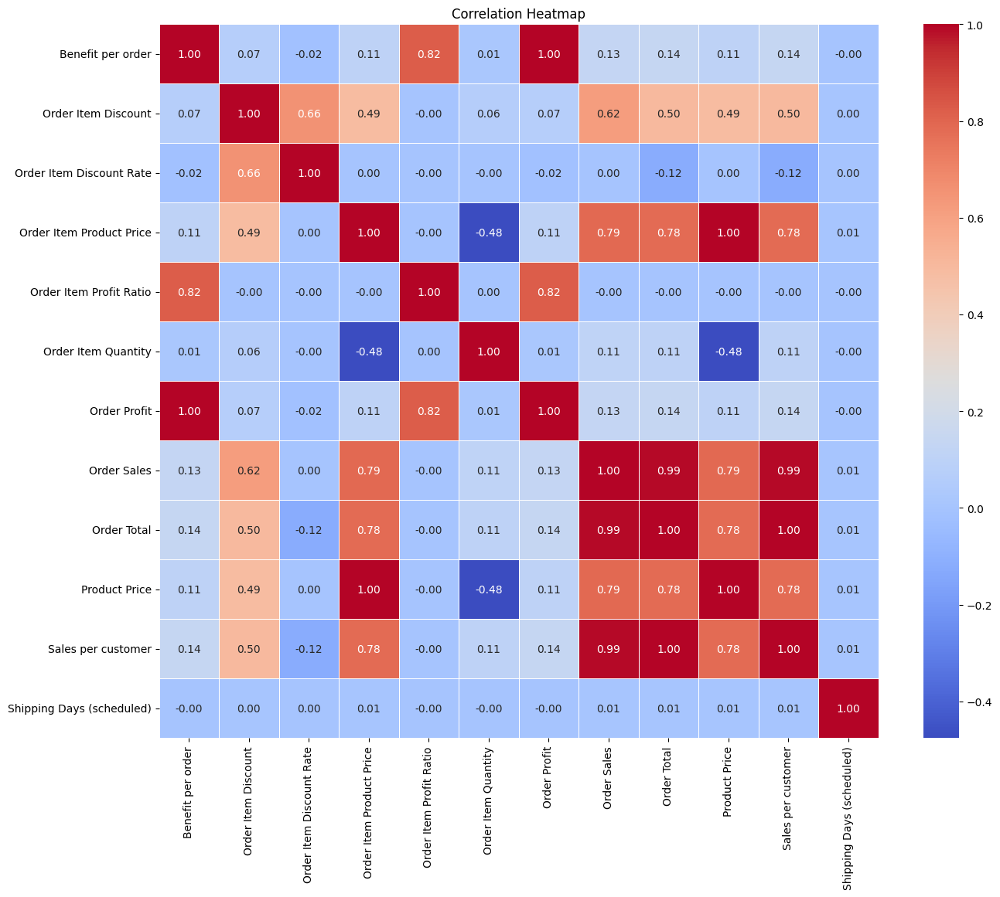

In [0]:
numerical_columns.remove('Delivery Late')
numerical_columns.remove('Shipping Days of Delay')
df_numerical = df_v1.select(numerical_columns)
correlation_matrix = df_numerical.toPandas().corr()

plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Correlation Heatmap")
plt.show()

The following pairs of columns have exactly the same values (correlation between the features is equal to 1):
- *Benefit per order* and *Order Profit Per Order*
- *Sales per customer* and *Order Item Total*
- *Order Item Product Price* and *Product Price*

One of the two per each pair is removed and the correlation matrix is plotted again:

In [0]:
df_v1 = df_v1 \
    .drop('Benefit per order') \
    .drop('Sales per customer') \
    .drop('Order Item Product Price')

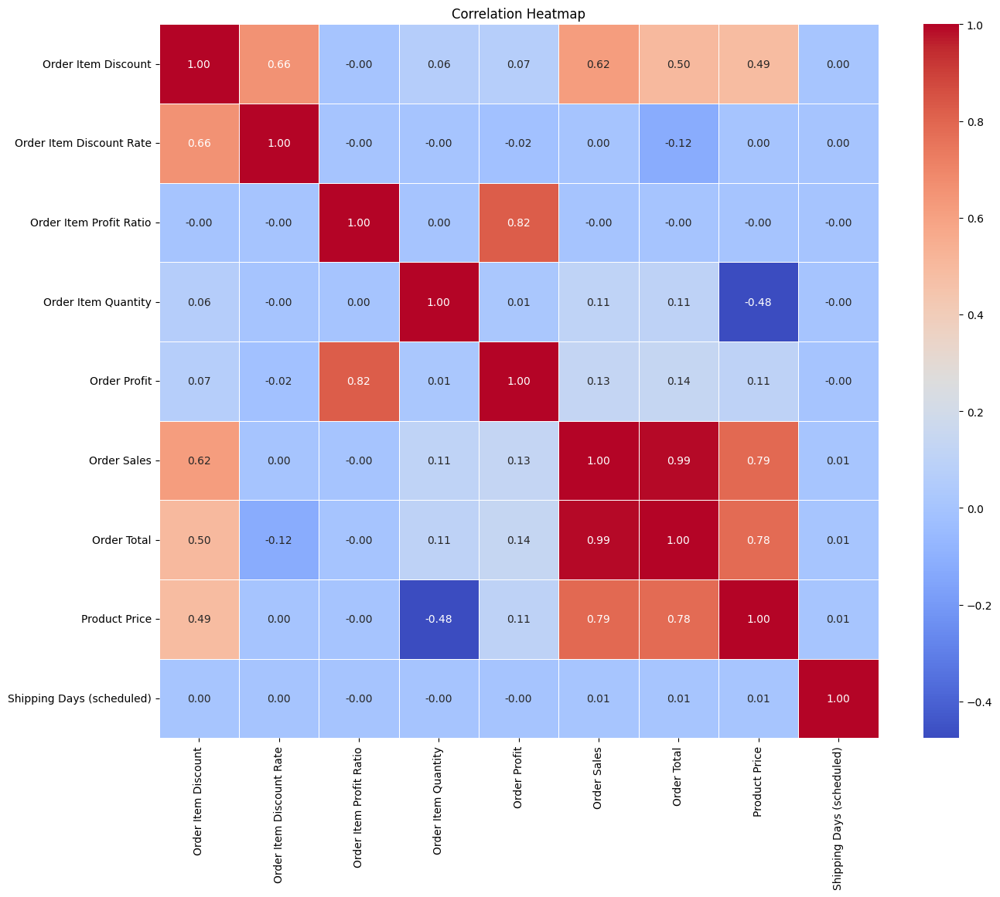

In [0]:
numerical_columns = [col for col, dtype in df_v1.dtypes if dtype in ('int', 'double')]
numerical_columns.remove('Delivery Late')
numerical_columns.remove('Shipping Days of Delay')
df_numerical = df_v1.select(numerical_columns)
correlation_matrix = df_numerical.toPandas().corr()

plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Correlation Heatmap")
plt.show()

The following analysis can be permormed:
1. *Order Item Profit Ratio* vs. *Order Profit*:
    - *Order Item Profit Ratio* is highly correlated (0.82) to *Order Profit* (= *Order Total* X *Order Item Profit Ratio*). *Order Item Profit Ratio* has a lower number of distinct values with respect to *Order Profit*, so the latter can be removed, but since it should be use used for the revenue-generated clusters analysis, both are kept for now.
2. *Order Sales* vs. *Order Total* vs *Product Price*:
    - *Order Sales* (= *Product Price* X *Order Item Quantity*) and *Order Total* (= *Order Sales* - *Order Item Discount*) are extremely correlated (0.99), indicating near-perfect redundancy.
    - Since both are highly correlated with *Product Price* (0.79 and 0.78, respectively), both are removed and ‘Product Price’ is kept (it has a lower number of distinct values). This reduces multicollinearity and keeps the feature with fewer distinct values.
    - This will streamline the dataset without losing much information, as *Product Price* encapsulates a significant portion of the variance in both *Order Sales* and *Order Total*.
3. *Order Item Discount Rate* vs. *Order Item Discount*:
    - *Order Item Discount* (= *Product Price* X *Order Item Discount Rate* X *Order Item Quantity*) is derived from *Order Item Discount Rate* and is correlated with it (0.66). Therefore, *Order Item Discount* is removed, especially because it has a lower number of distinct values. The formula can still be reconstructed if needed, as the critical components (price, discount rate, quantity) are retained.

*Order Sales*, *Order Total* and *Order Item Discount* are removed:

In [0]:
df_v1 = df_v1 \
    .drop(col('Order Sales')) \
    .drop(col('Order Total')) \
    .drop(col('Order Item Discount'))

### 3.6.2 - Analysis on Shipping Delay Influence

A data analysis to understand which numerical features influence shipping delays is performed in this section.

The numerical features are:

In [0]:
numerical_columns = [col for col, dtype in df_v1.dtypes if dtype in ('int', 'double')]
numerical_columns.remove('Delivery Late')
numerical_columns.remove('Shipping Days of Delay')
print(numerical_columns)

['Order Item Discount Rate', 'Order Item Profit Ratio', 'Order Item Quantity', 'Order Profit', 'Product Price', 'Shipping Days (scheduled)']


A first insight is obtained by observing the correlation between each features and the ones containing information about the delays:

In [0]:
target = ['Shipping Days of Delay', 'Delivery Late']
for c in numerical_columns:
    for t in target:
        correlation = df_v1.stat.corr(c, t)
        print(f"Correlation between '{c}' and '{t}': {correlation}")

Correlation between 'Order Item Discount Rate' and 'Shipping Days of Delay': 0.0024323703369090776
Correlation between 'Order Item Discount Rate' and 'Delivery Late': 0.0011237081540365552
Correlation between 'Order Item Profit Ratio' and 'Shipping Days of Delay': -0.003027274137635423
Correlation between 'Order Item Profit Ratio' and 'Delivery Late': -0.0028170908172662325
Correlation between 'Order Item Quantity' and 'Shipping Days of Delay': 0.001879830106269877
Correlation between 'Order Item Quantity' and 'Delivery Late': -0.00019761115118683732
Correlation between 'Order Profit' and 'Shipping Days of Delay': -0.0056373199306547096
Correlation between 'Order Profit' and 'Delivery Late': -0.004558045570108144
Correlation between 'Product Price' and 'Shipping Days of Delay': -0.00299941442125334
Correlation between 'Product Price' and 'Delivery Late': -0.0026644061045254857
Correlation between 'Shipping Days (scheduled)' and 'Shipping Days of Delay': -0.24755327081806888
Correlation

The analysis shows that most factors, like discounts, profit ratios, item quantity, and price, have minimal influence on shipping delays and late deliveries. The only feature with a moderate and meaningful relationship is *Shipping Days (Scheduled)*.

Considering *Shipping Days (Scheduled)*, the moderately negative correlations suggest that when more days are allocated for shipping (scheduled shipping days), the chances of both delays and late deliveries decrease. This makes sense since orders with more time allotted for delivery are less likely to face tight deadlines, giving logistics teams more flexibility to accommodate unforeseen issues. These correlations suggest that adjusting the number of scheduled shipping days could be a key factor in reducing delays and late deliveries.

Each feauture is now analyzed in more depth:

- *Order Item Discout Rate*

In [0]:
column = 'Order Item Discount Rate'
for x in df_v1.groupBy(col('Delivery Late')).agg(avg(col(column)).alias(f'Avg {column}'), stddev(col(column)).alias(f'Dev Stand {column}')).rdd.toLocalIterator():
    print(f"Average {column} when Delivery Late={x['Delivery Late']} is: {x[f'Avg {column}']}")
    print(f"Standard Deviation of {column} when Delivery Late={x['Delivery Late']} is: {x[f'Dev Stand {column}']}")

Average Order Item Discount Rate when Delivery Late=1 is: 0.10169253202416402
Standard Deviation of Order Item Discount Rate when Delivery Late=1 is: 0.07060831750404573
Average Order Item Discount Rate when Delivery Late=0 is: 0.10153254055354735
Standard Deviation of Order Item Discount Rate when Delivery Late=0 is: 0.07018687800139466


In [0]:
display(df_v1.select(col('Delivery Late'), col('Order Item Discount Rate')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Order Item Discount Rate
0,0.039999999
1,0.050000001
0,0.059999999
0,0.07
0,0.090000004
1,0.119999997
1,0.129999995
1,0.150000006
1,0.159999996
1,0.180000007


- *Order Item Profit Ratio*

In [0]:
column = 'Order Item Profit Ratio'
for x in df_v1.groupBy(col('Delivery Late')).agg(avg(col(column)).alias(f'Avg {column}'), stddev(col(column)).alias(f'Dev Stand {column}')).rdd.toLocalIterator():
    print(f"Average {column} when Delivery Late={x['Delivery Late']} is: {x[f'Avg {column}']}")
    print(f"Standard Deviation of {column} when Delivery Late={x['Delivery Late']} is: {x[f'Dev Stand {column}']}")

Average Order Item Profit Ratio when Delivery Late=1 is: 0.11966325167969774
Standard Deviation of Order Item Profit Ratio when Delivery Late=1 is: 0.46878735774514224
Average Order Item Profit Ratio when Delivery Late=0 is: 0.1223206298628857
Standard Deviation of Order Item Profit Ratio when Delivery Late=0 is: 0.4636807748845121


In [0]:
display(df_v1.select(col('Delivery Late'), col('Order Item Profit Ratio')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Order Item Profit Ratio
0,0.289999992
1,-0.800000012
0,-0.800000012
0,0.079999998
0,0.449999988
1,0.330000013
1,0.239999995
1,0.479999989
1,0.479999989
1,0.170000002


- *Order Item Quantity*

In [0]:
column = 'Order Item Quantity'
for x in df_v1.groupBy(col('Delivery Late')).agg(avg(col(column)).alias(f'Avg {column}'), stddev(col(column)).alias(f'Dev Stand {column}')).rdd.toLocalIterator():
    print(f"Average {column} when Delivery Late={x['Delivery Late']} is: {x[f'Avg {column}']}")
    print(f"Standard Deviation of {column} when Delivery Late={x['Delivery Late']} is: {x[f'Dev Stand {column}']}")

Average Order Item Quantity when Delivery Late=1 is: 2.1274652440995796
Standard Deviation of Order Item Quantity when Delivery Late=1 is: 1.4536013180792022
Average Order Item Quantity when Delivery Late=0 is: 2.1280459707803647
Standard Deviation of Order Item Quantity when Delivery Late=0 is: 1.4537677582167263


In [0]:
display(df_v1.select(col('Delivery Late'), col('Order Item Quantity')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Order Item Quantity
0,1
1,1
0,1
0,1
0,1
1,1
1,1
1,1
1,1
1,1


- *Product Price*

In [0]:
column = 'Product Price'
for x in df_v1.groupBy(col('Delivery Late')).agg(avg(col(column)).alias(f'Avg {column}'), stddev(col(column)).alias(f'Dev Stand {column}')).rdd.toLocalIterator():
    print(f"Average {column} when Delivery Late={x['Delivery Late']} is: {x[f'Avg {column}']}")
    print(f"Standard Deviation of {column} when Delivery Late={x['Delivery Late']} is: {x[f'Dev Stand {column}']}")

Average Product Price when Delivery Late=1 is: 140.9555337100677
Standard Deviation of Product Price when Delivery Late=1 is: 138.45616656175073
Average Product Price when Delivery Late=0 is: 141.70888488465607
Standard Deviation of Product Price when Delivery Late=0 is: 141.72737048196285


In [0]:
display(df_v1.select(col('Delivery Late'), col('Product Price')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Product Price
0,327.75
1,327.75
0,327.75
0,327.75
0,327.75
1,327.75
1,327.75
1,327.75
1,327.75
1,327.75


- *Shipping Days (scheduled)*

In [0]:
column = 'Shipping Days (scheduled)'
for x in df_v1.groupBy(col('Delivery Late')).agg(avg(col(column)).alias(f'Avg {column}'), stddev(col(column)).alias(f'Dev Stand {column}')).rdd.toLocalIterator():
    print(f"Average {column} when Delivery Late={x['Delivery Late']} is: {x[f'Avg {column}']}")
    print(f"Standard Deviation of {column} when Delivery Late={x['Delivery Late']} is: {x[f'Dev Stand {column}']}")

Average Shipping Days (scheduled) when Delivery Late=1 is: 2.471083899127061
Standard Deviation of Shipping Days (scheduled) when Delivery Late=1 is: 1.3725385265129464
Average Shipping Days (scheduled) when Delivery Late=0 is: 3.5528420025479086
Standard Deviation of Shipping Days (scheduled) when Delivery Late=0 is: 1.104099005758105


In [0]:
display(df_v1.select(col('Delivery Late'), col('Shipping Days (scheduled)')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Shipping Days (scheduled)
0,4
1,4
0,4
0,4
0,4
1,1
1,1
1,2
1,1
1,2


**Uniform Distribution Shape Across Features (Except Shipping Days (Scheduled))**

It can be noted that, except for the *Shipping Days (Scheduled)* feature, the distributions of numerical features for late and non-late deliveries share the same shape:
* Most of the features (like *Order Item Discount Rate*, *Order Item Profit Ratio*, *Order Item Quantity*, *Order Profit*, *Product Price*) are similarly distributed across both late and on-time deliveries. In other words, these features do not significantly differ between late and non-late deliveries.
* This supports the earlier correlation analysis, where these features had very low correlations with shipping delays or late deliveries. Since their distributions are nearly the same for both delivery statuses, they do not seem to be reliable predictors of whether an order will be late.

**Shipping Days (Scheduled) Shows a Different Distribution**

Unlike the other features, *Shipping Days (Scheduled)* does not have the same distribution shape when separated by the late delivery flag:
* This aligns with the earlier finding that the correlation between *Shipping Days (Scheduled)* and both *Shipping Days of Delay* (-0.2476) and *Delivery Late* (-0.3896) was the strongest among the features. Orders with more scheduled shipping days are less likely to be late, and this difference in distribution supports that relationship. A more dispersed or varied distribution of scheduled shipping days likely explains why some orders are delivered on time while others face delays.

**Higher Numbers for Late Deliveries (Due to Majority Representation)**

The fact that there are higher numbers in the features for late deliveries is attributed to the fact that the majority of orders are late :
* Since late deliveries dominate the dataset, this skew can create the impression of higher values for features across the board. However, the similar distribution shapes (outside of *Shipping Days (Scheduled)*) suggest that these numerical features are not meaningfully different between late and on-time deliveries when adjusted for their proportions in the data.

**Numerical Confirmation via Average and Standard Deviation**

Similarities between late and on-time deliveries are confirmed by comparing the averages and standard deviations of the numerical features:
* If the averages and standard deviations of the features do not differ significantly between late and on-time deliveries, it suggests that the features are not particularly useful for distinguishing between the two categories. This numerical confirmation backs up the idea that features like discount rate, profit ratio, item quantity, profit, and product price are poor predictors of whether an order will be delivered late.

Therefore, these features are removed:

In [0]:
df_v1 = df_v1 \
    .drop(col('Order Item Discount Rate')) \
    .drop(col('Order Item Profit Ratio')) \
    .drop(col('Order Item Quantity')) \
    .drop(col('Product Price'))

*Order Profit* is kept for the clusters analysis and *Shipping Days (schedueled)* is considered as useful feature for the predictive models:

In [0]:
numerical_columns_to_keep = ['Shipping Days (scheduled)']

## 3.7 - Time-Related Features
The following operation are performed with *Order Timestamp* and *Shipping Timestamp* columns:

- *Shipping Timestamp* is a future information (when the order is delivered), therefore it is deleted.
- *Order Timestamp* can be used to obtain the year, the month, the day and the day of the week of the orders in order to make some analysis.

In [0]:
df_v1 = df_v1 \
    .withColumn('Order Year', year(col('Order Timestamp'))) \
    .withColumn('Order Month', month(col('Order Timestamp')).cast('string')) \
    .withColumn('Order Day', day(col('Order Timestamp')).cast('string')) \
    .withColumn('Order Day of Week', dayofweek(col('Order Timestamp')).cast('string'))

The number of orders per each month of the year is computed, grouping them based on whether they have been delivered late or not:

In [0]:
display(df_v1 \
    .groupBy('Order Year', 'Order Month', 'Delivery Late') \
    .agg(count('Delivery Late').alias('Number of Orders')) \
    .withColumn('Order Date (yyyy-MM)', to_date(concat(df_v1['Order Year'], lit("-"), df_v1['Order Month'], lit("-01")), "yyyy-M-dd")))

Databricks visualization. Run in Databricks to view.

Order Year,Order Month,Delivery Late,Number of Orders,Order Date (yyyy-MM)
2015,10,1,2906,2015-10-01
2016,10,1,2957,2016-10-01
2015,3,0,2191,2015-03-01
2016,8,0,2221,2016-08-01
2015,7,1,2939,2015-07-01
2017,8,1,2994,2017-08-01
2016,8,1,2948,2016-08-01
2015,4,1,2760,2015-04-01
2017,2,0,1993,2017-02-01
2015,12,1,2937,2015-12-01


In [0]:
df_v1.createOrReplaceTempView("DataFrame1")

In [0]:
%sql
SELECT 
    `Order Year`, 
    `Order Month`, 
    `Delivery Late`, 
    COUNT(`Delivery Late`) AS `Number of Orders`,
    TO_DATE(CONCAT(`Order Year`, '-', `Order Month`, '-01'), 'yyyy-M-dd') AS `Order Date (yyyy-MM)`
FROM 
    DataFrame1
GROUP BY 
    `Order Year`, 
    `Order Month`, 
    `Delivery Late`

Databricks visualization. Run in Databricks to view.

Order Year,Order Month,Delivery Late,Number of Orders,Order Date (yyyy-MM)
2015,10,1,2906,2015-10-01
2016,10,1,2957,2016-10-01
2015,3,0,2191,2015-03-01
2016,8,0,2221,2016-08-01
2015,7,1,2939,2015-07-01
2017,8,1,2994,2017-08-01
2016,8,1,2948,2016-08-01
2015,4,1,2760,2015-04-01
2017,2,0,1993,2017-02-01
2015,12,1,2937,2015-12-01


There is no clear seasonal or monthly trend related to late deliveries. This suggests that the likelihood of an order being delivered late is not strongly influenced by the time of year or any specific months. Despite potential fluctuations in order volumes across different months, the rate of late deliveries does not seem to consistently rise or fall in any particular period.

Time information are removed, since no more useful:

In [0]:
df_v1 = df_v1 \
    .drop(col('Order Timestamp')) \
    .drop(col('Shipping Timestamp')) \
    .drop(col('Order Year'))

df_v0 = df_v0 \
    .drop(col('Order Timestamp')) \
    .drop(col('Shipping Timestamp'))

### 3.7.1 - Analysis on Shipping Delay Influence

A data analysis to understand more in details which time-related features influence shipping delays is performed:

- *Order Month*

In [0]:
display(df_v1.select(col('Delivery Late'), col('Order Month')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Order Month
0,1
1,1
0,1
0,1
0,1
1,1
1,1
1,1
1,1
1,1


- *Order Day*

In [0]:
display(df_v1.select(col('Delivery Late'), col('Order Day')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Order Day
0,31
1,13
0,13
0,13
0,13
1,13
1,13
1,13
1,13
1,13


- *Order Day of Week*

In [0]:
display(df_v1.select(col('Delivery Late'), col('Order Day of Week')))

Databricks visualization. Run in Databricks to view.

Delivery Late,Order Day of Week
0,4
1,7
0,7
0,7
0,7
1,7
1,7
1,7
1,7
1,7


The analysis of time-related features such as *Day*, *Day of the Week*, and *Month*, when separated by the late delivery flag, reveals that their distributions share the same shape. This implies that the day, day of the week, and month in which an order is placed do not significantly differ between late and on-time deliveries.

The fact that higher numbers appear for late deliveries is primarily due to the majority of orders being late, rather than any intrinsic pattern associated with time-related features.

These features are kept for the clusters analysis.

## 3.8 - High-Revenue Clusters Analysis
To undestand which features can be used to identify revenue-generating clusters, it is performed an aggration over *Order Profit* and the following columns are evaluated:
- Customer: *Customer Payment Type*, *Customer Segment*, *Customer State*
- Order: *Order Region*, *Order Month*, *Order Day*, *Order Day of Week*
- Delivery: *Delivery Market*
- Product: *Product Category*, *Product Department*

- *Customer Payment Type*

In [0]:
display(df_v1.groupBy("Customer Payment Type").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Customer Payment Type,Total Profit,Average Profit
TRANSFER,930551.7208587134,22.08815117516944
CASH,457981.0905976226,23.347323134054985
PAYMENT,887228.1210172998,21.26421534410171
DEBIT,1530522.42139673,22.087691706185762


It can be noticed that customers who pay with debit card generate the highest profit and customers who pay with cash genearate the lowest revenue (about 25% with respect debit card profit). The average profit is more or less the same.

- *Customer Segment*

In [0]:
display(df_v1.groupBy("Customer Segment").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Customer Segment,Total Profit,Average Profit
Consumer,1982737.2517645329,22.173804510999272
Home Office,665735.9706142021,21.602880572872184
Corporate,1157810.1314916324,22.042190330527774


It can be noticed that the profit generated by consumers is about 3 times the one generated by home office customer and that the one generated by corporate is about 2 times the one generated by home office. The average profit is more or less the same. 

- *Product Category* and *Product Department*

In [0]:
display(df_v1.groupBy("Product Category").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Product Category,Total Profit,Average Profit
Children's Clothing,26666.619622592996,42.941416461502406
Sporting Goods,11240.760107197997,33.45464317618452
Camping & Hiking,409895.61813110154,31.15418546257517
Fitness Accessories,5287.4600144549995,17.863040589374997
Computers,69232.11015882,162.8990827266353
CDs,360.609999449,1.3711406823155894
Consumer Electronics,12685.909928655,31.09291649180147
Basketball,1909.9699950740003,29.843281173031254
Health and Beauty,9281.119995114002,26.824046228653188
Pet Supplies,3505.179960607,7.426228730099576


In [0]:
display(df_v1.groupBy("Product Department").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Product Department,Total Profit,Average Profit
Golf,476328.81984458957,14.993981989567791
Health and Beauty,9281.119995114002,26.824046228653188
Apparel,845470.3795162578,18.033623691236862
Outdoors,141336.68998887902,15.251612171023957
Fitness,45270.16008089198,19.069149149491146
Footwear,388979.2687097972,28.002251004952644
Fan Shop,1759600.9557836258,27.47959576755151
Technology,111522.44999207999,79.94440859647311
Discs Shop,24133.889992185002,12.427337792062309
Book Shop,854.4400063280001,2.185268558383632


Computer is the category having the highest average profit, more than 2 times the second best one, that is Garden, and almost 3 times Cardio Equipment and Camping & Hiking. Fishing category is the one with the highest total profit, followed by Cleats and Camping & Hiking. There are 9 categories that stand out more than the others for total profit. 

Technology is the department having the highest average profit, almost 3 times the second best ones, that are Footwear, Fan Shop and Health and Beauty. Fan Shop category is the one with the highest total profit, more than 2 times Apparel, which, in turn, has a total profit that is almost 2 times the one related to Footwear and Golf. 

- *Order Month*, *Order Day* and *Order Day of Week* (time-related features)

In [0]:
display(df_v1.groupBy("Order Month").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Order Month,Total Profit,Average Profit
7,337424.75006177474,22.242897169530305
11,270447.23025708215,22.667607933709007
3,318196.2107115901,20.806657340717326
8,344853.69046602596,22.53209346396772
5,320488.790235276,21.132057908168008
6,314001.17066076293,21.682168944949794
9,349322.07023574464,23.558272878051298
1,353994.14064972184,20.475107909637448
10,319634.9200307829,25.679675426270016
4,321747.9699997291,21.77651235192752


In [0]:
display(df_v1.groupBy("Order Day").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Order Day,Total Profit,Average Profit
7,124424.53004856897,21.489556139649217
15,115526.72974647496,20.80063553231454
11,118967.95981866898,20.71529859283806
29,124952.32009842199,23.156471478580798
3,124417.36004817298,21.473482921672936
30,125001.62029355805,23.399779163900796
8,117143.27019237097,21.187062794785852
28,117384.25014005494,20.615428545847372
22,130831.07022385395,22.868566723274593
16,116495.87022776697,20.43787196978368


In [0]:
display(df_v1.groupBy("Order Day of Week").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Order Day of Week,Total Profit,Average Profit
7,567610.5907477156,22.93005537479662
3,526185.8904397917,21.402720782582538
5,492375.09073282283,19.925340566258868
6,544794.2711057165,21.90127723038056
1,561232.7706719439,22.601190829250317
4,524208.2500390234,21.442641225468297
2,589876.4901333365,24.01972840350747


When considering the diffent values of time-related features, very slight differences between the total and average profit can be noticed. There is only a small increasing trend of the average and total profit per month and a peak, but it is not significant.

- *Delivery Market*, *Customer State*, *Order Region* (geographical features)

In [0]:
display(df_v1.groupBy("Delivery Market").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Delivery Market,Total Profit,Average Profit
Europe,1131811.5407894799,23.536257294740473
Africa,240041.48014138508,21.520663451800708
Pacific Asia,826156.2510514718,20.870964305059413
LATAM,1069050.7916214138,21.680642309140598
USCA,539223.2902666124,21.895614174142707


In [0]:
display(df_v1.groupBy("Customer State").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Customer State,Total Profit,Average Profit
AZ,65053.29016268,22.31673762013036
SC,20726.500064454,32.18400631126398
LA,15523.99996989,17.423120055993266
MN,14319.81016347,22.87509610777955
NJ,64114.55002480698,21.180888676844063
DC,7573.030072588001,13.844661924292506
OR,34314.879878293,21.541041982607034
VA,37224.44015334801,20.71476914487925
RI,4607.920043539999,19.120000180663897
KY,4402.750002753,9.308139540704017


In [0]:
display(df_v1.groupBy("Order Region").agg(
    sum(col("Order Profit")).alias("Total Profit"),
    avg(col("Order Profit")).alias("Average Profit"),
))

Databricks visualization. Run in Databricks to view.

Order Region,Total Profit,Average Profit
South Asia,158754.74011865794,21.295069097070147
Eastern Europe,76854.70994959999,20.305075283910167
West of USA,159186.83034840602,20.959424667334563
Southern Europe,221344.16991266192,24.512089691324686
Central Asia,12578.620060600002,23.207786089667902
Central America,586567.1207846483,21.58560097095195
East of USA,148772.65019570992,22.48339885079491
North Africa,59356.76005649498,19.23420611033538
Northern Europe,226359.41052025193,24.06286919530689
Caribbean,166981.6900262829,21.00134448827605


It can be noticed that the profit generated by orders in Europe and Latin America is the highest, almost 2 times the one generated in USCA and 4 times the one generated in Africa, while the average profit is more of less the same. 

This observation reflects the one we can make observing the profits per region, since Central America and Wester Europe have the highest values.

Regarding the states, there is a peak of total profit in Puerto Rico (PR) and another one, more than 2 times lower, in California (CA). Observing the average profit, Alabama (AL) is the state that distinguishes itself from others.

### 3.8.1 - Dataset Clustering
After analyzing the features that can or cannot be used to identify revenue-generating clusters, the following are selected, based on their strong relationship with revenue generation:
1. *Customer Payment Type*: This feature significantly influences total profit, with debit card payments generating substantially higher profits than cash payments. Considering this feature can help distinguish clusters of customers with high and low profitability based on their payment behavior.
2. *Customer Segment*: This feature shows distinct profit patterns, with consumers generating much higher profits compared to home office customers, making it a useful feature for identifying different types of high-profit customer clusters.
3. *Delivery Market*: Geographical distinctions are evident, as Europe and Latin America lead in total profit. This feature is important for identifying clusters based on location-driven revenue potential.
4. *Product Department*: Departments like Technology, Footwear, and Fan Shop generate vastly different levels of profit, with Technology standing out for both total and average profit. This feature helps categorize products that generate the most profit and those that generate the least, providing valuable information for clustering.

These features are chosen because they represent both customer and product dimensions and explain much of the variance in revenue generation. In particular, they allow us to distinguish high-profit clusters based on payment behavior, customer type, geography, and product assortment, which are crucial for business strategy.

In [0]:
columns_for_clustering = ['Customer Payment Type', 'Customer Segment', 'Delivery Market', 'Product Department']

In [0]:
df_final = df_v1 \
    .drop(col('Order Month')) \
    .drop(col('Order Day')) \
    .drop(col('Order Day of Week'))

To identify revenue-generating clusters, a quartile-based statistical approach on the selected features (*Customer Payment Type*, *Customer Segment*, *Delivery Market*, *Product Department*) is applied. Here’s how the process works:
1. Feature Combination: First, all possible values of the selected features are combined, creating different “customer-product-location” profiles. For instance, combinations such as “Debit Card - Consumer - Europe - Technology” are obtained.
2. Total and Average Profit Calculation: For each combination, the total and average profit is calculated. This will allow to see which combinations of customer types, payment types, regions, and product departments generate the most revenue.
3. Quartile-Based Clustering:
   - The next step involves splitting the combinations into quartiles based on total and average profit.
   - The top quartile will represent the most profitable combinations (clusters), while the bottom quartile will represent the least profitable.
   - This statistical approach allows to identify which clusters (combinations) are driving the most revenue and helps target the characteristics that define high-profit groups.

This approach balances both the total profit, which highlights how much revenue a combination generates, and average profit, which indicates the profitability per order. By examining both, bias towards only high-volume combinations is avoided and there is a focus on sustained, consistent profitability. The resulting clusters will offer insights into where the company should invest or prioritize efforts to maximize profit.

In [0]:
cluster_df = df_final \
    .groupBy(*columns_for_clustering) \
    .agg(sum(col('Order Profit')).alias('Total Profit'), count(col('Order Profit')).alias('Number of Orders')) \
    .withColumn('Average Profit per Order', col('Total Profit')/col('Number of Orders')) \
    .orderBy('Total Profit')

In [0]:
display(cluster_df)

Customer Payment Type,Customer Segment,Delivery Market,Product Department,Total Profit,Number of Orders,Average Profit per Order
CASH,Corporate,Pacific Asia,Technology,-4182.14002615,13,-321.7030789346154
TRANSFER,Home Office,Europe,Technology,-1513.7499876090005,52,-29.110576684788473
CASH,Consumer,Pacific Asia,Health and Beauty,-1011.350019666,22,-45.97045543936363
CASH,Consumer,Pacific Asia,Technology,-953.609975841,16,-59.6006234900625
CASH,Home Office,Pacific Asia,Outdoors,-811.259977639,40,-20.281499440975
PAYMENT,Home Office,Africa,Footwear,-743.2200084799998,29,-25.62827615448275
PAYMENT,Consumer,Europe,Discs Shop,-397.539975426,39,-10.19333270323077
PAYMENT,Home Office,USCA,Footwear,-352.160020033,79,-4.457721772569621
DEBIT,Consumer,Europe,Discs Shop,-306.900005076,78,-3.934615449692308
DEBIT,Consumer,Europe,Fitness,-304.5200120460004,116,-2.6251725176379344


The quartiles for *Total Profit* and *Average Profit per Order* (only positive values) is computed:

In [0]:
# Calculate percentiles for 'Total Profit' (only positive values)
profit_percentiles = cluster_df.filter(col('Total Profit') >= 0).approxQuantile('Total Profit', [0.25, 0.5, 0.75], 0.0)

# Calculate percentiles for 'Average Profit per Order' (only positive values)
avg_profit_percentiles = cluster_df.filter(col('Average Profit per Order') >= 0).approxQuantile('Average Profit per Order', [0.25, 0.5, 0.75], 0.0)

print("Percentiles for 'Total Profit': " + str(profit_percentiles))
print("Percentiles for 'Average Profit per Order': " + str(avg_profit_percentiles))

Percentiles for 'Total Profit': [885.410003639, 3795.069999784, 10592.749918535]
Percentiles for 'Average Profit per Order': [13.337777669866666, 19.402314805240742, 27.949439947728003]


A quartile-based categories is assigned:

In [0]:
# Assign percentile-based categories for 'Total Profit'
cluster_df = cluster_df.withColumn(
    "Total Profit Level", \
    when(col("Total Profit") < 0, "Negative")
    .when((col("Total Profit") <= profit_percentiles[0]) & (col("Total Profit") >= 0), "Low")
    .when((col("Total Profit") > profit_percentiles[0]) & (col("Total Profit") <= profit_percentiles[1]), "Medium")
    .when((col("Total Profit") > profit_percentiles[1]) & (col("Total Profit") <= profit_percentiles[2]), "High")
    .otherwise("Very High")
)

# Similarly, for 'Average Profit per Order'
cluster_df = cluster_df.withColumn(
    "Average Profit per Order Level",
    when(col("Average Profit per Order") < 0, "Negative")
    .when((col("Average Profit per Order") <= avg_profit_percentiles[0]) & (col("Average Profit per Order") >= 0), "Low")
    .when((col("Average Profit per Order") > avg_profit_percentiles[0]) & (col("Average Profit per Order") <= avg_profit_percentiles[1]), "Medium")
    .when((col("Average Profit per Order") > avg_profit_percentiles[1]) & (col("Average Profit per Order") <= avg_profit_percentiles[2]), "High")
.otherwise("Very High")
)

The following approach is used to create a new column *Cluster-based Profitability* by combining the values from two existing columns: *Total Profit Level* and *Average Profit per Order Level*. The column is constructed using a series of conditional rules that categorize the profitability of each cluster based on the values of these two features:

- Negative Profitability
    - If the total profit is *Negative*, the cluster is categorized as *Negative* because a negative profit clearly indicates financial losses.
- Very High Profitability
    - If the total profit is *Very High* and the average profit per order is at least *Medium* (i.e., *Very High*, *High*, or *Medium*), the cluster is classified as *Very High*. This indicates that the cluster has both strong total profits and solid per-order efficiency.
    - However, if the total profit is *Very High* but the average profit per order is *Low*, the cluster is downgraded to *High* profitability. This reflects that while the total profit is great, the efficiency per order is not as strong.
- High Profitability
    - If the total profit is *High* and the average profit per order is *Medium* or higher, the cluster is classified as *High*. This shows that the cluster is performing well both in terms of total profitability and per-order efficiency.
    - If the total profit is *High* but the average profit per order is *Low*, the overall profitability is adjusted to *Medium*. This suggests that while the cluster is doing well overall, lower per-order profits reduce its rating.
- Medium Profitability
    - If the total profit is *Medium* and the average profit per order is *Very High*, the cluster is classified as *High*. This indicates that while total profit is moderate, high efficiency per order justifies a higher profitability rating.
    - If both the total profit and average profit per order are *Medium* or *High*, the cluster is classified as *Medium*, meaning it has moderate profitability both overall and per transaction.
    - If the total profit is *Medium* but the average profit per order is *Low*, the cluster is categorized as *Low*. This shows that poor efficiency in each order drags down the overall rating.
- Low Profitability
    - If the total profit is *Low* but the average profit per order is at least *High*, the cluster is classified as *Medium*. This reflects that, while total profitability is weak, good efficiency per order indicates potential for improvement if the number of orders increases.
    - If both the total profit and average profit per order are *Low* or *Medium*, the cluster is classified as *Low*. This indicates overall poor profitability and low efficiency per transaction.

To summarize:

- *Negative* profitability is for clusters with negative total profit.
- *Very High* profitability is assigned when total profit is very high and per-order profit is medium or better, though low per-order profit downgrades it to High.
- *High* profitability is assigned when total profit is high and average profit per order is moderate or better.
- *Medium* profitability captures clusters with moderate total profit and average efficiency, or high efficiency despite low total profits.
- *Low* profitability reflects clusters with poor total profits, especially when coupled with low per-order efficiency.

This set of rules is designed to capture both the overall scale of profitability (through total profit) and the efficiency of the business (through average profit per order), balancing the two to classify the cluster’s profitability meaningfully.

In [0]:
cluster_df = cluster_df.withColumn(
    'Cluster-based Profitability', \
    # negative total profit level
    when((col('Total Profit Level') == 'Negative'), 'Negative')
    # very high total profit level
    .when((col('Total Profit Level') == 'Very High') & ((col('Average Profit per Order Level') == 'Very High') | (col('Average Profit per Order Level') == 'High') | (col('Average Profit per Order Level') == 'Medium')), 'Very High')
    .when((col('Total Profit Level') == 'Very High') & (col('Average Profit per Order Level') == 'Low'), 'High')
    # high total profit level
    .when((col('Total Profit Level') == 'High') & ((col('Average Profit per Order Level') == 'Very High') | (col('Average Profit per Order Level') == 'High') | (col('Average Profit per Order Level') == 'Medium')), 'High')
    .when((col('Total Profit Level') == 'High') & (col('Average Profit per Order Level') == 'Low'), 'Medium')
    # medium total profit level
    .when((col('Total Profit Level') == 'Medium') & (col('Average Profit per Order Level') == 'Very High'), 'High')
    .when((col('Total Profit Level') == 'Medium') & ((col('Average Profit per Order Level') == 'High') | (col('Average Profit per Order Level') == 'Medium')), 'Medium')
    .when((col('Total Profit Level') == 'Medium') & (col('Average Profit per Order Level') == 'Low'), 'Low')
    .when((col('Total Profit Level') == 'Low')& ((col('Average Profit per Order Level') == 'Very High') | (col('Average Profit per Order Level') == 'High')), 'Medium')
    # low total profit level
    .when((col('Total Profit Level') == 'Low')& ((col('Average Profit per Order Level') == 'Medium') | (col('Average Profit per Order Level') == 'Low')), 'Low'))

A new column that encode the categorical *Cluster-based Profitability* column is created, assigning a numerical weight based on the different values:
- *Negative*: 1
- *Low*: 2
- *Medium*: 3
- *High*: 4
- *Very High*: 5

Also other combinations have been tested for the evaluation of the models.

In [0]:
cluster_df = cluster_df \
    .withColumn('Cluster-based Profitability (weight)',
                when(col('Cluster-based Profitability') == 'Negative', 1) \
                .when(col('Cluster-based Profitability') == 'Low', 2) \
                .when(col('Cluster-based Profitability') == 'Medium', 3) \
                .when(col('Cluster-based Profitability') == 'High', 4) \
                .when(col('Cluster-based Profitability') == 'Very High', 5))

The latter computed DataFrame is used to assign a cluster-based profitability weight to each rows in our original DataFrame, based on the combination of values of the features that have been used to identify the different clusters:

In [0]:
df_clustered = df_final.join(
    cluster_df,
    on=['Customer Payment Type', 'Customer Segment', 'Delivery Market', 'Product Department'],
    how='left'  # left join to keep all rows from df
).select(*df_final.columns, 'Cluster-based Profitability (weight)')

In [0]:
df_v0 = df_v0.join(
    cluster_df,
    on=['Customer Payment Type', 'Customer Segment', 'Delivery Market', 'Product Department'],
    how='left'  # left join to keep all rows from df
).select(*df_v0.columns, 'Cluster-based Profitability (weight)')

## 3.9 - Final Dataset
These are the features used to predict the shipping days of delay:

In [0]:
numerical_columns_to_keep

['Shipping Days (scheduled)']

In [0]:
categorical_columns_to_keep

['Shipping Mode', 'Product Category', 'Order Region', 'Customer State']

The final dataset for the prediction is obtained selecting the latter columns, along with the target variable and the cluster-based weight:

In [0]:
df_for_prediction = df_clustered.select(*numerical_columns_to_keep, *categorical_columns_to_keep, 'Shipping Days of Delay', 'Cluster-based Profitability (weight)')

In [0]:
display(df_for_prediction)

Shipping Days (scheduled),Shipping Mode,Product Category,Order Region,Customer State,Shipping Days of Delay,Cluster-based Profitability (weight)
2,Second Class,Cardio Equipment,West Asia,PR,0,4
2,Second Class,Cardio Equipment,West Asia,PR,3,4
2,Second Class,Cardio Equipment,Oceania,PR,4,4
2,Second Class,Cardio Equipment,Oceania,PR,3,4
4,Standard Class,Cardio Equipment,South Asia,PR,0,4
4,Standard Class,Electronics,Central Asia,PR,0,4
4,Standard Class,Cardio Equipment,South Asia,PR,2,4
4,Standard Class,Cardio Equipment,South Asia,PR,2,4
4,Standard Class,Cardio Equipment,West Asia,PR,2,4
4,Standard Class,Cardio Equipment,Oceania,PR,0,4


Databricks visualization. Run in Databricks to view.

---

#4 - Model Development and Evaluation
The dataset comprises 172,765 rows, which provides a robust foundation for building predictive models like **Linear Regression** and **XGBoost**. 

The selected features — both categorical (e.g., *Shipping Mode*, *Product Category*, *Order Region*) and numerical (*Shipping Days (scheduled)*) — have been thoughtfully curated, through their relevance. The removal of multicollinear features improves the interpretability and stability of linear models like Linear Regression, while models like XGBoost are generally robust to multicollinearity, so theis step is likely more impactful for the Linear Regression model.

## 4.1 - Data Splitting Strategy
As observed in the previous section, the dataset reveals that shipping delays are not influenced by historical trends, seasonal variations, or temporal changes. There is no indication that delays follow any predictable time-based patterns, such as those related to holidays, peak shipping seasons, or year-over-year fluctuations. This absence of time-related dependencies suggests that the prediction task is focused solely on static features.

Given this, instead of using a time-based split — such as dividing the dataset based on chronological order - an **atemporal** split is applied. This means the dataset can be split into training and test sets without regard to the sequence of events. This approach is more appropriate for predicting outcomes that are independent of temporal factors, ensuring the model captures the most relevant predictors for shipping delays.

Moreover, we perform a **stratified** split, ensuring that the distribution of the target numerical variable (*Shipping Days of Delay*) is the same in both training and test sets. The use of a stratified split for training and test sets ensures that the distribution of the target variable (*Shipping Days of Delay*) is preserved, reducing the risk of sampling bias. This is critical because non-uniform distributions in training vs. test sets could skew the results, leading to misleading conclusions about the model’s performance.
 
To do so, the following operations are done:
1. Assign a group for each value of *Shipping Days of Delay*.
2. Perform a split for each group separately.
3. Concatenate all split results to form the final training and testing sets.

In [0]:
def stratified_split(df, target_col, test_ratio, seed=42):
    train_dfs = []
    test_dfs = []

    unique_values = df.select(target_col).distinct().collect()
    unique_values = [row[target_col] for row in unique_values]

    for value in unique_values:
        value_df = df.filter(col(target_col) == value)
        
        value_df = value_df.withColumn("rand", rand(seed))

        train_df = value_df.filter(col("rand") > test_ratio)
        test_df = value_df.filter(col("rand") <= test_ratio)

        train_df = train_df.drop("rand")
        test_df = test_df.drop("rand")

        train_dfs.append(train_df)
        test_dfs.append(test_df)

    train_df = train_dfs[0]
    test_df = test_dfs[0]
    for idx in range(1, len(train_dfs)):
        train_df = train_df.union(train_dfs[idx]).orderBy(rand(seed))
        test_df = test_df.union(test_dfs[idx]).orderBy(rand(seed))
    
    return train_df, test_df

The splitting is perfomed, using a test ratio of 20%:

In [0]:
test_ratio = 0.2

train_df, test_df = stratified_split(df_for_prediction, 'Shipping Days of Delay', test_ratio)

train_df.groupBy('Shipping Days of Delay').count().show()
test_df.groupBy('Shipping Days of Delay').count().show()

+----------------------+-----+
|Shipping Days of Delay|count|
+----------------------+-----+
|                     1|46310|
|                     3| 5383|
|                     4| 5324|
|                     2|22056|
|                     0|59013|
+----------------------+-----+

+----------------------+-----+
|Shipping Days of Delay|count|
+----------------------+-----+
|                     1|11646|
|                     3| 1389|
|                     4| 1373|
|                     2| 5495|
|                     0|14773|
+----------------------+-----+



## 4.2 - Cluster-Based Weighted Training and Evaluation Strategy

To achieve the goal of minimizing the prediction error for rows belonging to highly profitable clusters, the model training and evaluation process are guided by defining a weighted regression metric. This way, more importance (higher weight) is assigned to rows that belong to higher profit segments.

**Apply Weights in Training**:
- During training, the model should pay more attention to rows that belong to highly profitable clusters. This can be achieved by assigning weights to each row based on *Cluster-based profitability (weight)*.
- The weight column is passed to the regression models, using the *weightCol* parameter, that tells the models to pay more attention to rows with higher weights, improving their performance on those profit level-based clusters.

**Weighted Evaluation Metric**:
- When evaluating the models, it should be defined a custom weighted evaluation metric that gives higher importance to errors in high-profit clusters. One way to achieve this is to compute a Weighted Mean Squared Error (WMSE) or a Weighted Mean Absolute Error (WMAE):

  Weighted Mean Squared Error: $$\text{WMSE} = \frac{\sum_{i=1}^{n} w_i \cdot (y_i - \hat{y_i})^2}{\sum_{i=1}^{n} w_i}$$

  Weighted Mean Absolute Error: $$\text{WMAE} = \frac{\sum_{i=1}^{n} w_i \cdot |y_i - \hat{y_i}|}{\sum_{i=1}^{n} w_i}$$

- The weighted evaluation can be directly achieved by using the built-in functionality of the *RegressionEvaluator*, without manually defining a custom evaluation function: using *weightCol* parameter, the evaluation metric (e.g., MSE, MAE) will be weighted by the values in the *weightCol*.

Using this weighted schema in both the training process and evaluation process, these latter are aligned. The models are trained by giving more importance to certain rows, and the evaluation is done by calculating a weighted error that respects those same weights.

In [0]:
# Evaluators for regression (WMSE)
wmse_evaluator = RegressionEvaluator(labelCol="Shipping Days of Delay", 
                                predictionCol="prediction", 
                                metricName="mse", 
                                weightCol='Cluster-based Profitability (weight)')
# Evaluators for regression (MSE)
mse_evaluator = RegressionEvaluator(labelCol="Shipping Days of Delay", 
                                predictionCol="prediction", 
                                metricName="mse")
                                
# Evaluators for regression (WMAE)
wmae_evaluator = RegressionEvaluator(labelCol="Shipping Days of Delay", 
                                predictionCol="prediction", 
                                metricName="mae", 
                                weightCol='Cluster-based Profitability (weight)')
# Evaluators for regression (MAE)
mae_evaluator = RegressionEvaluator(labelCol="Shipping Days of Delay", 
                                predictionCol="prediction", 
                                metricName="mae")

A function used to round the prediction of the regression models is defined.

Rounding the predictions of a regression model before evaluation is necessary when the target variable is **discrete** (e.g., the number of days of delay) for the following reasons:

1. **Target Alignment**: If the target is an integer (e.g., days of delay), the continuous predictions from a regression model (like 2.7) don't make sense. Rounding aligns predictions with the discrete nature of the target (e.g., 3 days).

2. **Practical Meaning**: Fractional predictions aren't actionable. For instance, predicting "2.4 days late" isn't useful for decision-making. Rounding provides clear, usable results.

3. **Real-World Evaluation**: Metrics like Mean Squared Error are more meaningful when comparing rounded predictions to actual discrete values. This gives a better assessment of how well the model meets the task's real-world requirements.

4. **Interpretability**: Rounded predictions are easier to interpret, making it clearer how to act on the model’s outputs.

In short, rounding ensures that predictions are practical, interpretable, and align with both real-world and evaluation needs.

In [0]:
def transform_predictions(df, col_name):
    """
    Transforms the given column in a PySpark DataFrame by setting negative values to 0
    and rounding positive values to the nearest integer.

    Parameters:
    df (DataFrame): Input PySpark DataFrame.
    col_name (str): Name of the column to be transformed.

    Returns:
    DataFrame: Transformed PySpark DataFrame with modified column.
    """
    return df.withColumn(
        col_name,
        when(col(col_name) < 0, 0)  # Set negative values to 0
         .otherwise(round(col(col_name)))  # Round positive values to nearest integer
    )


## 4.3 - Model Training and Evaluation
This section covers the training and evaluation of two regression models, Linear Regression and XGBoost, both using weighted and non-weighted training approaches.

Choosing the best hyperparameters with cross-validation involves splitting the training data into k folds. For each combination of hyperparameters, the model is trained on k-1 folds and validated on the remaining fold. This process is repeated for all folds, and the performance is averaged. The hyperparameter set with the best average performance across all folds is selected. This method ensures the model generalizes well to unseen data, avoiding overfitting to specific data splits, and results in more reliable and optimal hyperparameter choices.

Considering the size of the dataset, the training run takes around 6 minutes, therefore performing 5-fold cross-validation — with just 2 parameters and 2 values each — would require about 2 hours. However, Databricks terminates the cluster after 60 minutes, despite the cell performing the cross validation is still running. As a result, cross validation for hyperparameters tuning has not been performed.

Therefore, the default values for Linear Regression and XGBoost are used and the models are directly evaluated on the test set.

### 4.3.1 - Linear Regression
Linear regression is a fundamental statistical method used to model the relationship between a dependent variable and one or more independent variables. It aims to find the best-fitting line (or hyperplane in higher dimensions) that minimizes the residual sum of squares between observed and predicted values.

#### 4.3.1.1 - Weighted
Weighted linear regression assigns different weights to individual data points based on their importance.

In [0]:
categorical_features = categorical_columns_to_keep
numerical_features = numerical_columns_to_keep

# Indexing and OneHotEncoding of categorical features
indexers = [StringIndexer(inputCol=col, outputCol=f"{col}_index", handleInvalid='skip') for col in categorical_features]
encoders = [OneHotEncoder(inputCol=f"{col}_index", outputCol=f"{col}_encoded") for col in categorical_features]

# VectorAssembler for numerical features
numerical_vector_assembler = VectorAssembler(inputCols=numerical_features, 
                                             outputCol='numerical_feature_vector')

# Scaling of numerical features
scaler = StandardScaler(inputCol='numerical_feature_vector',
                        outputCol='scaled_numerical_feature_vector',
                        withStd=True, 
                        withMean=True)

# Final assembler (numerical scaled features + encoded categorical features)
final_vector_assembler = VectorAssembler(inputCols=['scaled_numerical_feature_vector'] + [f"{col}_encoded" for col in categorical_features], outputCol='final_feature_vector')

# Model definition with weightCol
lr = LinearRegression(featuresCol='final_feature_vector', 
                      labelCol='Shipping Days of Delay', 
                      loss='squaredError',
                      weightCol='Cluster-based Profitability (weight)')

# Pipeline creation
pipeline_lr = Pipeline(stages=indexers + encoders + [numerical_vector_assembler, scaler, final_vector_assembler, lr])

In [0]:
pipModel_lr = pipeline_lr.fit(train_df)

In [0]:
# Evaluation on test
predictions_lr = pipModel_lr.transform(test_df)
predictions_lr = transform_predictions(predictions_lr, "prediction")
wmse = wmse_evaluator.evaluate(predictions_lr)
mse = mse_evaluator.evaluate(predictions_lr)
wmae = wmae_evaluator.evaluate(predictions_lr)
mae = mae_evaluator.evaluate(predictions_lr)
print("Evaluation on Test of Linear Regression w/ Weighted Training")
print("--------------------------------------------------------------")
print(f"Weighted Mean Squared Error (WMSE): {wmse}")
print(f"Mean Squared Error (MSE): {mse}")
print("--------------------------------------------------------------")
print(f"Weighted Mean Absolute Error (WMAE): {wmae}")
print(f"Mean Absolute Error (MAE): {mae}")

Evaluation on Test of Linear Regression w/ Weighted Training
--------------------------------------------------------------
Weighted Mean Squared Error (WMSE): 0.9047512081790351
Mean Squared Error (MSE): 0.9048099950947861
--------------------------------------------------------------
Weighted Mean Absolute Error (WMAE): 0.7429161879945833
Mean Absolute Error (MAE): 0.7430533514152985


#### 4.3.1.2 - Not Weighted
Standard linear regression treats all observations equally, without considering their individual importance. 

In [0]:
categorical_features = categorical_columns_to_keep
numerical_features = numerical_columns_to_keep

# Indexing and OneHotEncoding of categorical features
indexers = [StringIndexer(inputCol=col, outputCol=f"{col}_index", handleInvalid='skip') for col in categorical_features]
encoders = [OneHotEncoder(inputCol=f"{col}_index", outputCol=f"{col}_encoded") for col in categorical_features]

# VectorAssembler for numerical features
numerical_vector_assembler = VectorAssembler(inputCols=numerical_features, 
                                             outputCol='numerical_feature_vector')

# Scaling of numerical features
scaler = StandardScaler(inputCol='numerical_feature_vector',
                        outputCol='scaled_numerical_feature_vector',
                        withStd=True, 
                        withMean=True)

# Final assembler (numerical scaled features + encoded categorical features)
final_vector_assembler = VectorAssembler(inputCols=['scaled_numerical_feature_vector'] + [f"{col}_encoded" for col in categorical_features], outputCol='final_feature_vector')

# Model definition
lr = LinearRegression(featuresCol='final_feature_vector', 
                      labelCol='Shipping Days of Delay', 
                      loss='squaredError')

# Pipeline creation
pipeline_lr_nw = Pipeline(stages=indexers + encoders + [numerical_vector_assembler, scaler, final_vector_assembler, lr])

In [0]:
pipModel_lr_nw = pipeline_lr_nw.fit(train_df)

In [0]:
# Evaluation on test
predictions_lr_nw = pipModel_lr_nw.transform(test_df)
predictions_lr_nw = transform_predictions(predictions_lr_nw, "prediction")
wmse_no_wt = wmse_evaluator.evaluate(predictions_lr_nw)
mse_no_wt = mse_evaluator.evaluate(predictions_lr_nw)
wmae_no_wt = wmae_evaluator.evaluate(predictions_lr_nw)
mae_no_wt = mae_evaluator.evaluate(predictions_lr_nw)
print("Evaluation on Test of Linear Regression w/o Weighted Training")
print("--------------------------------------------------------------")
print(f"Weighted Mean Squared Error (WMSE): {wmse_no_wt}")
print(f"Mean Squared Error (MSE): {mse_no_wt}")
print("--------------------------------------------------------------")
print(f"Weighted Mean Absolute Error (WMAE): {wmae_no_wt}")
print(f"Mean Absolute Error (MAE): {mae_no_wt}")

Evaluation on Test of Linear Regression w/o Weighted Training
--------------------------------------------------------------
Weighted Mean Squared Error (WMSE): 0.9052325544081687
Mean Squared Error (MSE): 0.9053005164901753
--------------------------------------------------------------
Weighted Mean Absolute Error (WMAE): 0.7433590265253862
Mean Absolute Error (MAE): 0.74348616441123


### 4.3.2 - XGBoost
XGBoost (Extreme Gradient Boosting) is a powerful ensemble learning method based on decision trees. It enhances predictive accuracy and computational efficiency through boosting, where weak learners (trees) are combined to create a strong predictive model. XGBoost is known for its performance and is particularly useful for regression tasks.

#### 4.3.2.1 - Weighted
In XGBoost, weighted training can be applied to adjust the contribution of each observation during model training.

In [0]:
categorical_features = categorical_columns_to_keep
numerical_features = numerical_columns_to_keep

# Indexing and OneHotEncoding of categorical features
indexers = [StringIndexer(inputCol=col, outputCol=f"{col}_index", handleInvalid='skip') for col in categorical_features]
encoders = [OneHotEncoder(inputCol=f"{col}_index", outputCol=f"{col}_encoded") for col in categorical_features]

# Assembler (numerical features + encoded categorical features)
final_vector_assembler = VectorAssembler(inputCols = numerical_features + [f"{col}_encoded" for col in categorical_features], outputCol='final_feature_vector')

# Model definition with weight_col
xgb = SparkXGBRegressor(features_col='final_feature_vector', 
                        label_col='Shipping Days of Delay', 
                        objective='reg:squarederror',
                        weight_col='Cluster-based Profitability (weight)')

# Pipeline creation
pipeline_xgb = Pipeline(stages=indexers + encoders + [final_vector_assembler, xgb])

In [0]:
pipModel_xgb = pipeline_xgb.fit(train_df)

/databricks/python/lib/python3.10/site-packages/xgboost/sklearn.py:782: UserWarning: Loading a native XGBoost model with Scikit-Learn interface.
  warnings.warn("Loading a native XGBoost model with Scikit-Learn interface.")


In [0]:
# Evaluation on test
predictions_xgb = pipModel_xgb.transform(test_df)
predictions_xgb = transform_predictions(predictions_xgb, "prediction")
wmse = wmse_evaluator.evaluate(predictions_xgb)
mse = mse_evaluator.evaluate(predictions_xgb)
wmae = wmae_evaluator.evaluate(predictions_xgb)
mae = mae_evaluator.evaluate(predictions_xgb)
print("Evaluation on Test of XGBoost w/ Weighted Training")
print("--------------------------------------------------------------")
print(f"Weighted Mean Squared Error (WMSE): {wmse}")
print(f"Mean Squared Error (MSE): {mse}")
print("--------------------------------------------------------------")
print(f"Weighted Mean Absolute Error (WMAE): {wmae}")
print(f"Mean Absolute Error (MAE): {mae}")

Evaluation on Test of XGBoost w/ Weighted Training
--------------------------------------------------------------
Weighted Mean Squared Error (WMSE): 0.8976144480884137
Mean Squared Error (MSE): 0.8974521741639495
--------------------------------------------------------------
Weighted Mean Absolute Error (WMAE): 0.7258316058351999
Mean Absolute Error (MAE): 0.7255965605793924


#### 4.3.2.2 - Not Weighted
In the standard implementation of XGBoost without weights, all training instances are treated equally.

In [0]:
categorical_features = categorical_columns_to_keep
numerical_features = numerical_columns_to_keep

# Indexing and OneHotEncoding of categorical features
indexers = [StringIndexer(inputCol=col, outputCol=f"{col}_index", handleInvalid='skip') for col in categorical_features]
encoders = [OneHotEncoder(inputCol=f"{col}_index", outputCol=f"{col}_encoded") for col in categorical_features]

# Assembler (numerical features + encoded categorical features)
final_vector_assembler = VectorAssembler(inputCols = numerical_features + [f"{col}_encoded" for col in categorical_features], outputCol='final_feature_vector')

# Model definition
xgb = SparkXGBRegressor(features_col='final_feature_vector', 
                        label_col='Shipping Days of Delay', 
                        objective='reg:squarederror')
                        
# Pipeline creation
pipeline_xgb_nw = Pipeline(stages=indexers + encoders + [final_vector_assembler, xgb])

In [0]:
pipModel_xgb_nw = pipeline_xgb_nw.fit(train_df)

In [0]:
# Evaluation on test
predictions_xgb_nw = pipModel_xgb_nw.transform(test_df)
predictions_xgb_nw = transform_predictions(predictions_xgb_nw, "prediction")
wmse = wmse_evaluator.evaluate(predictions_xgb_nw)
mse = mse_evaluator.evaluate(predictions_xgb_nw)
wmae = wmae_evaluator.evaluate(predictions_xgb_nw)
mae = mae_evaluator.evaluate(predictions_xgb_nw)
print("Evaluation on Test of XGBoost w/o Weighted Training")
print("--------------------------------------------------------------")
print(f"Weighted Mean Squared Error (WMSE): {wmse}")
print(f"Mean Squared Error (MSE): {mse}")
print("--------------------------------------------------------------")
print(f"Weighted Mean Absolute Error (WMAE): {wmae}")
print(f"Mean Absolute Error (MAE): {mae}")

Evaluation on Test of XGBoost w/o Weighted Training
--------------------------------------------------------------
Weighted Mean Squared Error (WMSE): 0.8975502685911959
Mean Squared Error (MSE): 0.8977984245606948
--------------------------------------------------------------
Weighted Mean Absolute Error (WMAE): 0.726357877712386
Mean Absolute Error (MAE): 0.7261159361745102


## 4.4 - Results Discussion
For regression models that predict the number of days of delay, whose value is rounded to obtain an integer value, (Weighted) Mean Absolute Error is generally more appropriate than (Weighted) Mean Squared Error because it provides a clear interpretation in days making it highly intuitive since it reflects the average error directly in terms of days. 

Therefore, the results discussion is done considering this metric.

- **Linear Regression**
    - **Weighted Training WMAE**: 0.74292
    - **Non-Weighted Training WMAE**: 0.74336
- **XGBoost**
    - **Weighted Training WMAE**: 0.72583
    - **Non-Weighted Training WMAE**: 0.72636

### 4.4.1 - Linear Regression vs. XGBoost

The XGBoost model outperforms Linear Regression, with both the weighted and non-weighted XGBoost models achieving lower WMAE values than their Linear Regression counterparts. This result is expected, given XGBoost’s non-linear capabilities and ability to capture complex relationships, which are often present in datasets with categorical variables.

XGBoost’s architecture allows it to capture subtle interactions between categorical and numerical features more effectively than Linear Regression, making it better suited for tasks where delay days might be influenced by intricate, non-linear relationships.

### 4.4.2 - Weighted vs. Non-Weighted Training

Across both Linear Regression and XGBoost, weighted training shows a slight improvement in Weighted Mean Absolute Error (WMAE), indicating that profitability-based weighting contributes positively, though marginally, to the model’s accuracy for profitable clusters. The slight performance improvement in the weighted versions of both models suggests that while weighting adds some value, it does not fundamentally alter the model’s prediction patterns. This outcome could imply that the delay behaviors across different profitability clusters do not vary significantly, meaning that delays are driven by factors affecting all clusters similarly, rather than by unique characteristics of specific profitability levels.

The limited reduction in WMAE for weighted models suggests that profitability-based weighting might not be as impactful because:
- Uniformity Across Profit Clusters: If high- and low-profit clusters share similar delay patterns, the model’s predictions won’t be strongly differentiated by profitability. For example, if high-profit orders do not systematically experience different delays than low-profit orders, the added emphasis on high-profit clusters in training has minimal influence on predictive accuracy.
- Feature-Target Relationship: The selected features (‘Shipping Mode,’ ‘Product Category,’ etc.) may explain delay patterns consistently across profitability clusters, providing adequate general predictive capability without requiring profitability differentiation.
- Dataset Structure: The dataset’s structure and stratified split have ensured consistent distributions of the target variable (‘Shipping Days of Delay’) across clusters, which might inherently limit the effect of weighting if all clusters experience similar delays under the same conditions.

For the linear model, weighted training has a minimal impact, reflecting the model’s simpler architecture and inability to capture non-linear relationships. This suggests that Linear Regression is less responsive to profitability-based weighting since it lacks the flexibility to adjust its predictions based on complex relationships between features and profitability.

The weighted XGBoost model achieved a slightly lower WMAE than the non-weighted version, demonstrating that the model’s structure, which leverages decision trees, is more adaptable to the added emphasis on profitable clusters. XGBoost’s ability to capture non-linear and interaction effects makes it more receptive to profitability-based weighting, as it can adjust its error minimization focus according to the weighted importance assigned during training.

From a business perspective, while weighted training is valuable for targeting high-profit clusters, the narrow margin between weighted and non-weighted results suggests that the company can still rely on the non-weighted model if needed, without major performance trade-offs.

The limited effect of weighting indicates room for further exploration, such as weight optimization, experimenting different weighting schemes to see if they yield better results.

#### 4.4.2.1 - Model Sensitivity to Cluster-Based Profit Weight Schemes
The models have been trained using different weighting schemes in order to explore their impact on WMAE. 

These are the results:

**Weights: 1-2-5-8-10**
- **Linear Regression**
    - **Weighted Training WMAE**: 0.74298
    - **Non-Weighted Training WMAE**: 0.74328
- **XGBoost**
    - **Weighted Training WMAE**: 0.72537
    - **Non-Weighted Training WMAE**: 0.72647

**Weights: 1-4-10-16-20**
- **Linear Regression**
    - **Weighted Training WMAE**: 0.74299
    - **Non-Weighted Training WMAE**: 0.74329
- **XGBoost**
    - **Weighted Training WMAE**: 0.72533
    - **Non-Weighted Training WMAE**: 0.72646
  
**Weights: 1-5-15-30-50**
- **Linear Regression**
    - **Weighted Training WMAE**: 0.74311
    - **Non-Weighted Training WMAE**: 0.74325
- **XGBoost**
    - **Weighted Training WMAE**: 0.72550
    - **Non-Weighted Training WMAE**: 0.72657

**1. Impact of Weighting Schema on Linear Regression**
- Across all three weighting schemas tested, the Linear Regression model shows minimal variation in WMAE. The weighted models consistently achieve only slight improvements over the non-weighted version, regardless of the weight distribution (e.g., 1-2-5-8-10 vs. 1-5-15-30-50).
- This limited response to varied weighting suggests that Linear Regression lacks the flexibility to significantly adjust its predictions based on differential weighting of profitable clusters. The model’s linear nature means that while it can apply more emphasis on higher-profit clusters, it does not capture complex patterns that might amplify the importance of these weights effectively.
- Consequently, for Linear Regression, finer granularity in weights does not translate into substantial performance gains. This result implies that for linear models, simpler, less extreme weighting schemes (e.g., 1-2-5-8-10) are likely sufficient without the need for aggressive weighting adjustments.

**2. Impact of Weighting Schema on XGBoost**
- XGBoost shows slightly better sensitivity to changes in the weighting schema compared to Linear Regression, though the performance gains are modest. Across all tested schemas, XGBoost with weighted training consistently outperforms its non-weighted counterpart, indicating that the model is receptive to profitability-based prioritization.
- The 1-4-10-16-20 schema yields the lowest WMAE (0.72533), though only marginally better than the others (e.g., 1-2-5-8-10 with WMAE of 0.72537). This suggests that moderately increasing weights across clusters effectively balances focus on high-profit clusters without introducing excessive bias toward them.
- In contrast, the most extreme schema (1-5-15-30-50) leads to a slight increase in WMAE (0.72550), implying that excessively high weights for profitable clusters may lead to diminishing returns or even slight overfitting. This pattern suggests that while XGBoost can utilize weighted data, there is a threshold beyond which additional weighting does not substantially benefit and may even degrade performance.

**3. Optimal Weighting Observations**
- The slight improvement in WMAE with moderate weighting (1-4-10-16-20) indicates that an optimal weighting schema for XGBoost lies in a balanced emphasis rather than in extreme values. This schema effectively prioritizes high-profit clusters without excessively penalizing errors in lower-profit ones, aligning well with the business objective to optimize accuracy for profitability-driven segments.
- For Linear Regression, the weighting impact plateaus early, showing minimal gains across schemas. This suggests that linear models may not be the most effective choice if profitability-based prioritization is critical. Instead, focusing on models that naturally accommodate weight-based adjustments, like XGBoost, might be preferable.

**4. Business Implications**
- XGBoost with a moderate weighting schema (1-4-10-16-20) emerges as the most effective setup, achieving the lowest WMAE. This model is better suited to applications requiring sensitivity to profitability, as it leverages weights more effectively than Linear Regression.
- Aggressive weighting (e.g., 1-5-15-30-50) shows limited additional benefit and can even slightly degrade performance, suggesting that overly large weights introduce unnecessary bias. Moderate, strategically chosen weights align better with the goal of focusing on high-profit clusters without compromising overall model accuracy.

### 4.4.3 - Baseline Comparison
Comparing these models with a baseline version trained without weighting and without feature selection or data cleaning steps can provide valuable insights. 

**Understanding the Value of Data Cleaning and Feature Selection**
- Data cleaning and feature selection are essential to improving model accuracy and efficiency by removing noise, multicollinear features, and irrelevant information. By comparing the optimized models to a baseline trained on the unprocessed data with all features, it is possible to quantify the extent to which these preprocessing steps improve model performance.

**Establishing a Meaningful Benchmark**
- A baseline using all features without weighting would provide a “null hypothesis” performance, showing how the models perform with minimal intervention. This benchmark is useful for assessing whether the added steps (weighting and feature selection) meaningfully contribute to lowering error rates or not.

**Evaluating Model Robustness**
- By testing the models with and without data preprocessing, it is possible to assess model robustness across different data conditions. This helps identify if certain models (like XGBoost) can better handle uncleaned or redundant data due to inherent regularization and flexibility, compared to more rigid models like Linear Regression.

**Practical Implications and Efficiency**
- Practicality is also key: if the baseline with all features performs comparably, it could justify a simpler pipeline, potentially saving time and computational resources. However, if preprocessing yields clear benefits, this justifies the additional steps for more accurate delay predictions, especially for high-profit clusters.

**Assessing Predictive Power of Available Information**
- A baseline model trained on the unprocessed dataset reveals how much predictive power the available raw data holds. If the baseline performs significantly worse, it suggests that data preprocessing (such as handling missing values, removing irrelevant or redundant features, and addressing multicollinearity) is essential to make the dataset viable for accurate delay predictions. Conversely, if the baseline performs similarly to the optimized models, it may imply that the available data might lack additional useful features that strongly correlate with delay days.

**Evaluating Model Adaptability and Dataset Limitations**
- If all models struggle to achieve low accuracy metrics, it suggests limitations in the dataset’s quality or structure for delay prediction. This could indicate that the dataset lacks key delay-related variables. Therefore, additional data collection, might be necessary to improve model accuracy.

In [0]:
test_ratio = 0.20

train_df_v0, test_df_v0 = stratified_split(df_v0, 'Shipping Days of Delay', test_ratio)

In [0]:
numerical_features = [col for col, dtype in df_v0.dtypes if dtype in ('int', 'double')]
categorical_features = [x.name for x in df_v0.schema.fields if x.dataType == StringType()]
numerical_features.remove('Shipping Days of Delay')
numerical_features.remove('Delivery Late')
numerical_features.remove('Cluster-based Profitability (weight)')
print(f"Numerical features: {numerical_features}")
print(f"Categorical features: {categorical_features}")

Numerical features: ['Benefit per order', 'Order Item Discount', 'Order Item Discount Rate', 'Order Item Product Price', 'Order Item Profit Ratio', 'Order Item Quantity', 'Order Profit', 'Order Sales', 'Order Total', 'Product Price', 'Sales per customer', 'Shipping Days (scheduled)']
Categorical features: ['Customer City', 'Customer Country', 'Customer Payment Type', 'Customer Segment', 'Customer State', 'Delivery Market', 'Order City', 'Order Country', 'Order Region', 'Order State', 'Product Category', 'Product Department', 'Shipping Mode']


In [0]:
# Indexing and OneHotEncoding of categorical features
indexers = [StringIndexer(inputCol=col, outputCol=f"{col}_index", handleInvalid='skip') for col in categorical_features]
encoders = [OneHotEncoder(inputCol=f"{col}_index", outputCol=f"{col}_encoded") for col in categorical_features]

# VectorAssembler for numerical features
numerical_vector_assembler = VectorAssembler(inputCols=numerical_features, 
                                             outputCol='numerical_feature_vector')

# Scaling of numerical features
scaler = StandardScaler(inputCol='numerical_feature_vector',
                        outputCol='scaled_numerical_feature_vector',
                        withStd=True, 
                        withMean=True)

# Final assembler (numerical scaled features + encoded categorical features)
final_vector_assembler_lr = VectorAssembler(inputCols=['scaled_numerical_feature_vector'] + [f"{col}_encoded" for col in categorical_features], outputCol='final_feature_vector')

# Model definition
lr = LinearRegression(featuresCol='final_feature_vector', 
                      labelCol='Shipping Days of Delay', 
                      loss='squaredError')

# Pipeline creation
pipeline_lr_v0 = Pipeline(stages=indexers + encoders + [numerical_vector_assembler, scaler, final_vector_assembler_lr, lr])

# Assembler (numerical features + encoded categorical features)
final_vector_assembler_xgb = VectorAssembler(inputCols = numerical_features + [f"{col}_encoded" for col in categorical_features], outputCol='final_feature_vector')

# Model definition
xgb = SparkXGBRegressor(features_col='final_feature_vector', 
                        label_col='Shipping Days of Delay', 
                        objective='reg:squarederror')
                        
# Pipeline creation
pipeline_xgb_v0 = Pipeline(stages=indexers + encoders + [final_vector_assembler_xgb, xgb])

In [0]:
pipModel_lr_nw_v0 = pipeline_lr_v0.fit(train_df_v0)

As faced for cross validation, Databricks terminates the cluster after 60 minutes, despite the cell performing the fit of the Linear Regression pipeline model is still running. As a result, the comparison between the previously trained models and this baseline has not been performed.

In [0]:
pipModel_xgb_nw_v0 = pipeline_xgb_v0.fit(train_df_v0)

/databricks/python/lib/python3.10/site-packages/xgboost/sklearn.py:782: UserWarning: Loading a native XGBoost model with Scikit-Learn interface.
  warnings.warn("Loading a native XGBoost model with Scikit-Learn interface.")


In [0]:
# Evaluation on test
predictions_xgb_nw_v0 = pipModel_xgb_nw_v0.transform(test_df_v0)
predictions_xgb_nw_v0 = transform_predictions(predictions_xgb_nw_v0, "prediction")
mse_v0 = mse_evaluator.evaluate(predictions_xgb_nw_v0)
wmse_v0 = wmse_evaluator.evaluate(predictions_xgb_nw_v0)
mae_v0 = mae_evaluator.evaluate(predictions_xgb_nw_v0)
wmae_v0 = wmae_evaluator.evaluate(predictions_xgb_nw_v0)
print("Evaluation on Test of XGBoost Trained with Initial Dataset")
print("--------------------------------------------------------------")
print(f"Mean Squared Error (MSE): {mse_v0}")
print(f"Weighted Mean Squared Error (WMSE): {wmse_v0}")
print("--------------------------------------------------------------")
print(f"Mean Absolute Error (MAE): {mae_v0}")
print(f"Weighted Mean Absolute Error (WMAE): {wmae_v0}")

Evaluation on Test of XGBoost Trained with Initial Dataset
--------------------------------------------------------------
Mean Squared Error (MSE): 0.8763406758159381
Weighted Mean Squared Error (WMSE): 0.8759852493185827
--------------------------------------------------------------
Mean Absolute Error (MAE): 0.7186887325567985
Weighted Mean Absolute Error (WMAE): 0.7184351451018117


The baseline XGBoost model, trained without weighting and using the dataset before the in-depth feature selection, achieves a Weighted Mean Absolute Error (WMAE) of 0.71844, which is lower than the WMAE obtained with the previously trained versions (around 0.72533 – 0.72647), but still high. 

This result suggests that XGBoost, due to its robustness and ability to handle redundancy through regularization, might have benefited from the almost full feature set and highlights that feature selection might not always enhance performance, especially in models like XGBoost, which can manage large, complex feature spaces effectively.

Howewer, the persistently high WMAE, points to potential limitations in the dataset and highlights areas where further improvements could enhance predictive accuracy:
- The high WMAE suggests that the dataset may lack key variables that strongly influence shipping delays, such as real-time logistics capacity, carrier performance, traffic conditions, or warehouse processing data. Without these factors, which are likely to impact delays directly, the model may miss important contextual information needed for accurate predictions.
- Incorporating additional data sources with external or more granular features could better inform the model about the practical variables that drive shipping delays, thus helping to reduce prediction errors.

From a business perspective, the slightly better performance of the unweighted, nearly full-feature baseline model suggests that minimal preprocessing may already provide good predictive value. This approach simplifies the data pipeline, yet, with the higher number of input features, the prediction time increases. As a result, while the modeling pipeline may be more straightforward, the added computational load for each prediction could impact response times, which is an important trade-off to consider.

---

# 5 - Conclusions
The prediction of the **days of delay** for an order can play a critical role in optimizing a shipping company’s logistics operations in several ways:
1. **Proactive Problem Resolution**: By predicting delays in advance, the company can take preventive actions to mitigate potential issues. For example, if a significant delay is predicted, the company can proactively reroute shipments, expedite processing, or arrange alternative transportation methods. This helps avoid last-minute disruptions and reduces the likelihood of missed delivery deadlines.
2. **Dynamic Resource Allocation**: Predicted delays allow the company to allocate resources more effectively. For instance, the company can assign additional staff or fleet vehicles to regions or shipping routes that are more prone to delays, ensuring that potential bottlenecks are addressed before they affect the customer. This dynamic allocation leads to better fleet management, improved workload distribution, and more efficient use of resources.
3. **Prioritization of High-Value Orders**: Delays predicted for high-revenue customers can trigger special handling protocols. The company can use predictions to prioritize these orders, ensuring faster response times for resolving delays. This not only improves service for key clients but also strengthens customer loyalty and retention, as the most valuable clients experience fewer disruptions.
4. **Optimized Scheduling and Route Planning**: By incorporating delay predictions into logistics planning, the company can optimize delivery schedules and adjust routes to minimize the impact of potential delays. For example, orders predicted to be delayed can be scheduled for earlier dispatch, while delivery routes can be reorganized to avoid congested areas or busy shipping times, reducing the overall risk of delay.
5. **Inventory and Warehouse Management**: Predicted delays can also inform decisions on how to manage inventory levels and warehouse operations. By knowing which shipments are likely to be delayed, the company can adjust stock levels at specific locations to avoid shortages or overstock situations, optimizing supply chain efficiency.
6. **Enhanced Customer Communication**: Accurate delay predictions empower the company to communicate effectively with customers, providing early notifications of potential delays and setting realistic expectations. This transparency improves customer satisfaction by keeping clients informed and reduces frustration caused by unexpected delays.

By integrating delay predictions into their logistics strategy, the company can make **data-driven decisions** that streamline operations, enhance customer service, and ultimately reduce costs associated with shipping delays.

This project underscores that predicting days of delay for shipments can provide significant operational and strategic benefits to a logistics company. However, the analysis highlights several considerations regarding the predictive models and dataset quality that impact the effectiveness of delay forecasting:
- Trade-offs in Model Complexity and Prediction Efficiency: The slightly better performance of an unweighted, nearly full-feature XGBoost model suggests that minimal preprocessing can deliver good predictive results. However, while this approach simplifies the data pipeline, it also increases the computational load and time required for generating predictions due to the larger number of input features. This trade-off between pipeline simplicity and prediction speed is crucial, as higher prediction times could affect the timely implementation of proactive measures for delay management.
- Importance of Data Quality and Feature Richness: The high Weighted Mean Absolute Error (WMAE) observed across all configurations suggests limitations in the dataset’s ability to fully capture delay dynamics. Incorporating additional contextual features, such as real-time logistics metrics, weather conditions, or carrier performance data, could enhance predictive accuracy. Enriching the dataset with these types of variables may better support proactive problem resolution and dynamic resource allocation by improving the model’s ability to accurately predict delays.
- Considerations on Weighting for Profitability: Profitability-based weighting yielded only minor gains in model performance, implying that profitability clusters may not differ significantly in their delay patterns. This suggests that more straightforward approaches without weighting can still effectively guide operations.

Ultimately, this analysis reinforces that, while delay prediction can drive significant value across logistics operations, achieving optimal predictive performance requires balancing model complexity, dataset quality, and feature engineering to align with the company’s logistical and strategic objectives.